<a href="https://www.kaggle.com/code/dataranch/world-happiness-dataset-fastai-xgboost?scriptVersionId=108131837" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# <div style="text-align: center; background-color: blue; color: white; padding: 14px; line-height: 1;border-radius:20px">**World Happiness Stats Model Comparison + Feature Importance 📊**</div>
- Preprocessing
    - Detect continuous and categorical variables.
    - Normalize and impute data.
    

- For every target variable in the dataset:
    - Compare performance on 27 models + a TabNet model.
    - Output model performance and processed data in CSV format for every dataset.
    - Save plots + CSVs of XGBoost Feature Importances.
    - Save best performing FastAI model.

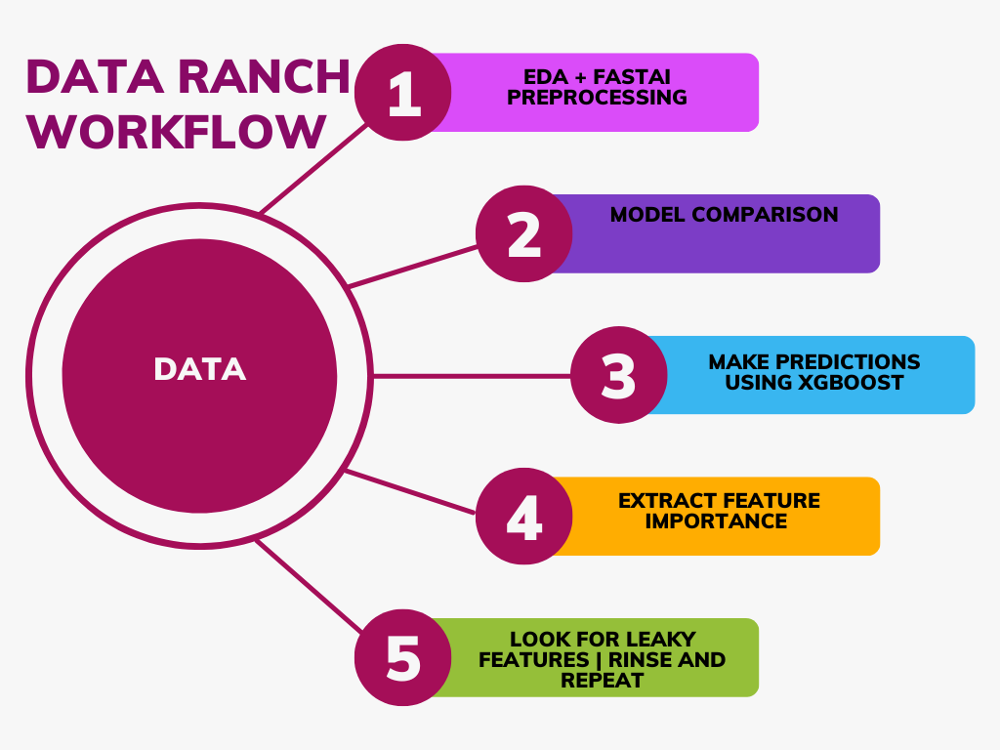

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
!pip install lazypredict

In [3]:
!pip install --upgrade pandas

In [4]:
!pip install fast-tabnet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.8/41.8 kB 1.1 MB/s eta 0:00:00


In [5]:
!pip install fastai

  Attempting uninstall: typing-extensions
    Found existing installation: typing_extensions 4.3.0
    Uninstalling typing_extensions-4.3.0:
      Successfully uninstalled typing_extensions-4.3.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-io 0.21.0 requires tensorflow-io-gcs-filesystem==0.21.0, which is not installed.
tensorflow 2.6.4 requires h5py~=3.1.0, but you have h5py 3.7.0 which is incompatible.
tensorflow 2.6.4 requires numpy~=1.19.2, but you have numpy 1.21.6 which is incompatible.
tensorflow 2.6.4 requires tensorboard<2.7,>=2.6.0, but you have tensorboard 2.10.0 which is incompatible.
tensorflow 2.6.4 requires typing-extensions<3.11,>=3.7, but you have typing-extensions 4.1.1 which is incompatible.
tensorflow-transform 1.9.0 requires pyarrow<6,>=1, but you have pyarrow 8.0.0 which is incompatible.
tensorflow-transform 1.9.0 requires te

In [6]:
!pip install pandas-profiling

  Attempting uninstall: markupsafe
    Found existing installation: MarkupSafe 2.1.1
    Uninstalling MarkupSafe-2.1.1:
      Successfully uninstalled MarkupSafe-2.1.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
beatrix-jupyterlab 3.1.7 requires google-cloud-bigquery-storage, which is not installed.
werkzeug 2.2.2 requires MarkupSafe>=2.1.1, but you have markupsafe 2.0.1 which is incompatible.


In [7]:
#A program that takes a csv and trains models on it. Streamlined model selection.
#==============================================================================

#LazyPredict
import lazypredict
from lazypredict.Supervised import LazyRegressor
from lazypredict.Supervised import LazyClassifier
#Baysian Optimization
from bayes_opt import BayesianOptimization
#Pandas stack
import pandas as pd
import pandas_profiling
import numpy as np
#FastAI
from fastai.tabular.all import *
from fastai.tabular.core import *
#Plots
import matplotlib.pyplot as plt
import seaborn as sns
#System
import os
import sys
import traceback
#Fit an xgboost model
from xgboost import XGBRegressor
from xgboost import XGBClassifier
from xgboost import plot_importance
from sklearn.metrics import mean_squared_error
from sklearn.metrics import roc_auc_score
#Random
import random

#TabNet
from fast_tabnet.core import *

import shutil

In [8]:
%matplotlib inline

In [9]:
# For Styling
plt.style.use('seaborn-bright')

In [10]:
#Project Variables
#===================================================================================================
PROJECT_NAME = 'world-happiness-based-on-cpi-20152020'
VARIABLE_FILES = False
#Maximum amount of rows to take
SAMPLE_COUNT = 20000
FASTAI_LEARNING_RATE = 1e-1
AUTO_ADJUST_LEARNING_RATE = False
#Set to True automatically infer if variables are categorical or continuous
ENABLE_BREAKPOINT = True
#When trying to declare a column a continuous variable, if it fails, convert it to a categorical variable
CONVERT_TO_CAT = False
REGRESSOR = True
SEP_DOLLAR = True
SEP_PERCENT = True
SHUFFLE_DATA = True

In [11]:
input_dir = f'../input/{PROJECT_NAME}'
param_dir = f'/kaggle/working/{PROJECT_NAME}'
TARGET = ''
PARAM_DIR = param_dir
print(f'param_dir: {param_dir}')
if not os.path.exists(param_dir):
    os.makedirs(param_dir)
#rename any file in param_dir/file that ends with csv to data.csv
for file in os.listdir(input_dir):
    if file.endswith('.csv'):
        print('CSV!')
        if 'classification_results' not in file and 'regression_results' not in file:
            #os.rename(f'{input_dir}/{file}', f'{param_dir}/data.csv')
            shutil.copy(f'{input_dir}/{file}', f'{param_dir}/data.csv')
        #os.rename(f'{param_dir}/{file}', f'{param_dir}/data.csv')
try:
    df = pd.read_csv(f'{param_dir}/data.csv', nrows=SAMPLE_COUNT)
except:
    print(f'Please place a file named data.csv in {param_dir}')
    #sys.exit()

param_dir: /kaggle/working/world-happiness-based-on-cpi-20152020
CSV!


In [12]:
df

,Country,happiness_score,gdp_per_capita,family,health,freedom,generosity,government_trust,dystopia_residual,continent,Year,social_support,cpi_score
0,Norway,7.54,1.62,1.53,0.80,0.64,0.36,0.32,2.28,Europe,2015,0.00,88
1,Denmark,7.52,1.48,1.55,0.79,0.63,0.36,0.40,2.31,Europe,2015,0.00,91
2,Iceland,7.50,1.48,1.61,0.83,0.63,0.48,0.15,2.32,Europe,2015,0.00,79
3,Switzerland,7.49,1.56,1.52,0.86,0.62,0.29,0.37,2.28,Europe,2015,0.00,86
4,Finland,7.47,1.44,1.54,0.81,0.62,0.25,0.38,2.43,Europe,2015,0.00,90
...,...,...,...,...,...,...,...,...,...,...,...,...,...
787,Botswana,3.48,1.00,0.00,0.49,0.51,0.03,0.10,0.26,Africa,2020,1.09,60
788,Tanzania,3.48,0.46,0.00,0.44,0.51,0.27,0.20,0.72,Africa,2020,0.87,38
789,Rwanda,3.31,0.34,0.00,0.57,0.60,0.24,0.49,0.55,Africa,2020,0.52,54
790,Zimbabwe,3.30,0.43,0.00,0.38,0.38,0.15,0.08,0.84,Africa,2020,1.05,24


In [13]:
df.isna().sum()

Country              0
happiness_score      0
gdp_per_capita       0
family               0
health               0
freedom              0
generosity           0
government_trust     0
dystopia_residual    0
continent            0
Year                 0
social_support       0
cpi_score            0
dtype: int64

In [14]:
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<AxesSubplot:>

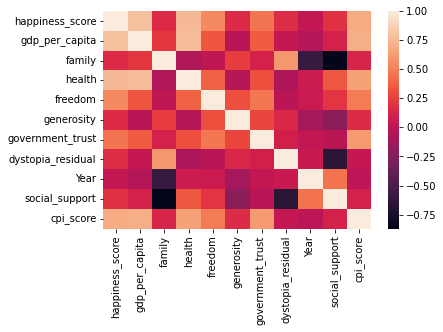

In [15]:
sns.heatmap(df.corr())

In [16]:
df.head().style.background_gradient(cmap = "inferno")

,Country,happiness_score,gdp_per_capita,family,health,freedom,generosity,government_trust,dystopia_residual,continent,Year,social_support,cpi_score
0,Norway,7.54,1.62,1.53,0.80,0.64,0.36,0.32,2.28,Europe,2015,0.00,88
1,Denmark,7.52,1.48,1.55,0.79,0.63,0.36,0.40,2.31,Europe,2015,0.00,91
2,Iceland,7.50,1.48,1.61,0.83,0.63,0.48,0.15,2.32,Europe,2015,0.00,79
3,Switzerland,7.49,1.56,1.52,0.86,0.62,0.29,0.37,2.28,Europe,2015,0.00,86
4,Finland,7.47,1.44,1.54,0.81,0.62,0.25,0.38,2.43,Europe,2015,0.00,90


In [17]:
df.describe().T.style.background_gradient(cmap = "viridis")

,count,mean,std,min,25%,50%,75%,max
happiness_score,792.00,5.47,1.12,2.57,4.59,5.49,6.30,7.81
gdp_per_capita,792.00,0.93,0.39,0.00,0.64,0.99,1.23,2.10
family,792.00,0.50,0.55,0.00,0.00,0.00,1.04,1.61
health,792.00,0.65,0.23,0.00,0.51,0.69,0.82,1.14
freedom,792.00,0.43,0.15,0.00,0.33,0.44,0.55,0.72
generosity,792.00,0.21,0.12,0.00,0.13,0.20,0.27,0.84
government_trust,792.00,0.13,0.11,0.00,0.05,0.09,0.15,0.55
dystopia_residual,792.00,1.38,1.08,0.00,0.00,1.73,2.24,3.60
Year,792.00,2017.50,1.71,2015.00,2016.00,2017.50,2019.00,2020.00
social_support,792.00,0.61,0.64,0.00,0.00,0.18,1.27,1.64


In [18]:
df.columns

Index(['Country', 'happiness_score', 'gdp_per_capita', 'family', 'health',
       'freedom', 'generosity', 'government_trust', 'dystopia_residual',
       'continent', 'Year', 'social_support', 'cpi_score'],
      dtype='object')

In [19]:
#remove 'Unnamed:0' as it's a leaky feature
del(df['Country'])
del(df['continent'])

Target Variable: cpi_score
CATS=====================
['Year']
CONTS=====================
['happiness_score', 'gdp_per_capita', 'family', 'health', 'freedom', 'generosity', 'government_trust', 'dystopia_residual', 'social_support']
10
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['happiness_score', 'gdp_per_capita', 'family', 'health', 'freedom', 'generosity', 'government_trust', 'dystopia_residual', 'social_support']
Categorical variables that made the cut : ['Year']
Tabular Object size: 792


  2%|▏         | 1/42 [00:00<00:05,  7.60it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.7961606407690827, 'Adjusted R-Squared': 0.7822940176921495, 'RMSE': 9.190613038633805, 'Time taken': 0.1314997673034668}


 10%|▉         | 4/42 [00:00<00:02, 18.49it/s]

{'Model': 'BaggingRegressor', 'R-Squared': 0.866119995621832, 'Adjusted R-Squared': 0.8570125123308001, 'RMSE': 7.448319834327094, 'Time taken': 0.06020045280456543}
{'Model': 'BayesianRidge', 'R-Squared': 0.6356667003581129, 'Adjusted R-Squared': 0.6108821221511818, 'RMSE': 12.287114115699321, 'Time taken': 0.029054641723632812}
{'Model': 'DecisionTreeRegressor', 'R-Squared': 0.7600972422641779, 'Adjusted R-Squared': 0.743777326771945, 'RMSE': 9.970526184964527, 'Time taken': 0.017284393310546875}
{'Model': 'DummyRegressor', 'R-Squared': -0.004291679559871087, 'Adjusted R-Squared': -0.07261084143469243, 'RMSE': 20.400011, 'Time taken': 0.011732101440429688}
{'Model': 'ElasticNet', 'R-Squared': 0.6228693084348403, 'Adjusted R-Squared': 0.597214159348775, 'RMSE': 12.501047, 'Time taken': 0.014573812484741211}
ElasticNetCV model failed to execute
Gram matrix passed in via 'precompute' parameter did not pass validation when a single element was checked - please check that it was computed 

 26%|██▌       | 11/42 [00:00<00:01, 16.94it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': 0.8737580338881866, 'Adjusted R-Squared': 0.8651701450370428, 'RMSE': 7.232731332743224, 'Time taken': 0.26643919944763184}
{'Model': 'GammaRegressor', 'R-Squared': 0.6245582925351107, 'Adjusted R-Squared': 0.5990180403266149, 'RMSE': 12.473022805485693, 'Time taken': 0.018663644790649414}
{'Model': 'GaussianProcessRegressor', 'R-Squared': 0.7235494953833239, 'Adjusted R-Squared': 0.7047433386066793, 'RMSE': 10.703089369373217, 'Time taken': 0.09027767181396484}
{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.8296822627604918, 'Adjusted R-Squared': 0.8180960221319539, 'RMSE': 8.400988642125613, 'Time taken': 0.2702481746673584}


 40%|████      | 17/42 [00:01<00:02, 11.56it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.85246845685375, 'Adjusted R-Squared': 0.8424322974560459, 'RMSE': 7.818850346365997, 'Time taken': 0.3439207077026367}
{'Model': 'HuberRegressor', 'R-Squared': 0.6164135300472531, 'Adjusted R-Squared': 0.5903192123633927, 'RMSE': 12.607590616048908, 'Time taken': 0.024138927459716797}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.8299746719903234, 'Adjusted R-Squared': 0.8184083231461277, 'RMSE': 8.393774, 'Time taken': 0.013543367385864258}
{'Model': 'KernelRidge', 'R-Squared': -3.6735819347942433, 'Adjusted R-Squared': -3.9915126786577977, 'RMSE': 44.007366, 'Time taken': 0.05494332313537598}
{'Model': 'Lars', 'R-Squared': 0.634995093661769, 'Adjusted R-Squared': 0.6101648279244744, 'RMSE': 12.298434, 'Time taken': 0.03937697410583496}


 48%|████▊     | 20/42 [00:01<00:01, 14.40it/s]

{'Model': 'LarsCV', 'R-Squared': 0.633405861043193, 'Adjusted R-Squared': 0.6084674842434101, 'RMSE': 12.325177, 'Time taken': 0.07458209991455078}
{'Model': 'Lasso', 'R-Squared': 0.6336330305345766, 'Adjusted R-Squared': 0.6087101074416907, 'RMSE': 12.321359, 'Time taken': 0.011861085891723633}
LassoCV model failed to execute
Gram matrix passed in via 'precompute' parameter did not pass validation when a single element was checked - please check that it was computed properly. For element (5,6) we computed 138.90020751953125 but the user-supplied value was 138.90023803710938.
{'Model': 'LassoLars', 'R-Squared': -0.004291679559871087, 'Adjusted R-Squared': -0.07261084143469243, 'RMSE': 20.400011, 'Time taken': 0.011285066604614258}
{'Model': 'LassoLarsCV', 'R-Squared': 0.6334605736552961, 'Adjusted R-Squared': 0.6085259188019148, 'RMSE': 12.324259, 'Time taken': 0.026200294494628906}
{'Model': 'LassoLarsIC', 'R-Squared': 0.6333967390367151, 'Adjusted R-Squared': 0.608457741692274, 'RMSE

 67%|██████▋   | 28/42 [00:03<00:01,  7.70it/s]

{'Model': 'MLPRegressor', 'R-Squared': 0.7082020616770985, 'Adjusted R-Squared': 0.6883518617911868, 'RMSE': 10.996173, 'Time taken': 1.315643310546875}
{'Model': 'NuSVR', 'R-Squared': 0.6445967160369712, 'Adjusted R-Squared': 0.6204196218898264, 'RMSE': 12.135597852722977, 'Time taken': 0.07557177543640137}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.5431846395393899, 'Adjusted R-Squared': 0.5121087646781239, 'RMSE': 13.75849111073477, 'Time taken': 0.02306342124938965}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.6275036216941015, 'Adjusted R-Squared': 0.6021637320134281, 'RMSE': 12.42400122433357, 'Time taken': 0.026747941970825195}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': 0.4677310975581166, 'Adjusted R-Squared': 0.431522328684519, 'RMSE': 14.851352455116341, 'Time taken': 0.013135194778442383}
{'Model': 'PoissonRegressor', 'R-Squared': 0.6906458543386729, 'Adjusted R-Squared': 0.6696013546338206, 'RMSE': 11.32213759449486, 'Time taken': 0.017071008

 76%|███████▌  | 32/42 [00:10<00:07,  1.36it/s]

{'Model': 'QuantileRegressor', 'R-Squared': -0.04378395350424258, 'Adjusted R-Squared': -0.11478966462698015, 'RMSE': 20.797242999273237, 'Time taken': 7.4096574783325195}
{'Model': 'RANSACRegressor', 'R-Squared': 0.5283284570503052, 'Adjusted R-Squared': 0.49624195752991773, 'RMSE': 13.980423, 'Time taken': 0.1377851963043213}


 95%|█████████▌| 40/42 [00:11<00:00,  2.81it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.8698523629236308, 'Adjusted R-Squared': 0.8609987821701363, 'RMSE': 7.343762142462356, 'Time taken': 0.43225622177124023}
{'Model': 'Ridge', 'R-Squared': 0.635061360563649, 'Adjusted R-Squared': 0.6102356027788632, 'RMSE': 12.2973175, 'Time taken': 0.012522220611572266}
{'Model': 'RidgeCV', 'R-Squared': 0.6357038725665083, 'Adjusted R-Squared': 0.6109218230812368, 'RMSE': 12.28648728469378, 'Time taken': 0.011423587799072266}
{'Model': 'SGDRegressor', 'R-Squared': 0.633553557046652, 'Adjusted R-Squared': 0.6086252275940431, 'RMSE': 12.322695399669817, 'Time taken': 0.012832403182983398}
{'Model': 'SVR', 'R-Squared': 0.6979088038486679, 'Adjusted R-Squared': 0.6773583823417746, 'RMSE': 11.188438851207026, 'Time taken': 0.041707515716552734}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.6349949534213686, 'Adjusted R-Squared': 0.6101646781439106, 'RMSE': 12.298436, 'Time taken': 0.011899471282958984}
{'Model': 'TweedieRegressor', 

100%|██████████| 42/42 [00:11<00:00,  3.54it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.8430496251160631, 'Adjusted R-Squared': 0.8323727288654551, 'RMSE': 8.064578, 'Time taken': 0.5106453895568848}
{'Model': 'LGBMRegressor', 'R-Squared': 0.8488274632409363, 'Adjusted R-Squared': 0.8385436172029047, 'RMSE': 7.914744662543209, 'Time taken': 0.17452669143676758}
Project: world-happiness-based-on-cpi-20152020
world-happiness-based-on-cpi-20152020
Target: cpi_score
cpi_score
Target Standard Deviation: 19.26704978942871
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
ExtraTreesRegressor                          0.87       0.87  7.23        0.27
RandomForestRegressor                        0.86       0.87  7.34        0.43
BaggingRegressor                             0.86       0.87  7.45        0.06
HistGradientBoostingRegressor                0.84       0.85  7.82        0.34
LGBMRegressor                                0.84  

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time
0,1520.759644,495.261383,22.254467,00:00
1,977.229492,4320.704590,65.732063,00:00


Better model found at epoch 0 with _rmse value: 22.254467010498047.
No improvement since epoch 0: early stopping


,Year,happiness_score,gdp_per_capita,family,health,freedom,generosity,government_trust,dystopia_residual,social_support,cpi_score,cpi_score_pred
0,2.00,-0.31,-0.02,0.89,0.44,-1.53,-0.16,-0.89,0.58,-0.92,42.00,25.76
1,4.00,0.25,-0.47,-0.94,-0.60,1.24,-0.58,-0.64,-1.31,0.99,29.00,30.62
2,3.00,-0.13,0.36,-0.94,0.62,-1.30,-0.97,0.17,-1.31,1.37,44.00,47.18
3,4.00,0.85,0.15,-0.94,0.12,0.46,-0.84,-0.33,-1.31,1.38,35.00,22.71
4,3.00,-1.23,-0.92,-0.94,-0.96,0.04,0.28,-0.33,-1.31,0.73,37.00,13.71
5,1.00,1.57,1.17,1.55,0.83,-0.13,0.96,-0.35,1.30,-0.92,61.00,45.45
6,2.00,1.54,0.24,0.71,0.73,0.39,-0.58,0.82,2.05,-0.92,30.00,24.92
7,4.00,-1.90,-1.28,-0.94,-1.32,-1.24,-1.06,-0.55,-1.31,0.76,14.00,27.30
8,5.00,1.66,1.35,1.06,0.89,0.98,2.13,1.83,1.07,-0.92,77.00,59.02


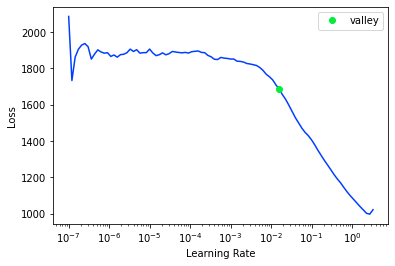

<Figure size 720x720 with 0 Axes>

XGBoost Predictions vs Actual==========
   actual  predicted
0   82.00      78.81
1   33.00      30.96
2   34.00      36.05
3   26.00      27.31
4   47.00      58.44
XGBoost RMSE:  8.077563


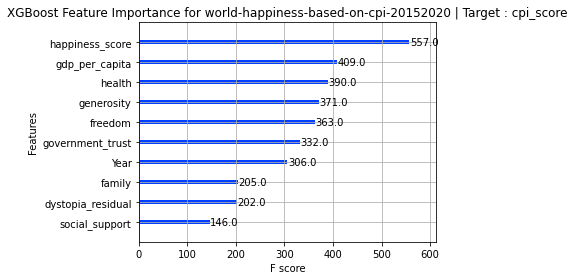

Target Variable: social_support
CATS=====================
['Year']
CONTS=====================
['happiness_score', 'gdp_per_capita', 'family', 'health', 'freedom', 'generosity', 'government_trust', 'dystopia_residual', 'cpi_score']
10
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['happiness_score', 'gdp_per_capita', 'family', 'health', 'freedom', 'generosity', 'government_trust', 'dystopia_residual', 'cpi_score']
Categorical variables that made the cut : ['Year']
Tabular Object size: 792


  2%|▏         | 1/42 [00:00<00:05,  8.02it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.9659576023018801, 'Adjusted R-Squared': 0.963641792934661, 'RMSE': 0.1181077575639896, 'Time taken': 0.12455868721008301}


 14%|█▍        | 6/42 [00:00<00:01, 30.24it/s]

{'Model': 'BaggingRegressor', 'R-Squared': 0.9734262595292685, 'Adjusted R-Squared': 0.97161852208228, 'RMSE': 0.10435053932365139, 'Time taken': 0.050936222076416016}
{'Model': 'BayesianRidge', 'R-Squared': 0.92263017356739, 'Adjusted R-Squared': 0.917366920068573, 'RMSE': 0.1780549963110321, 'Time taken': 0.013188600540161133}
{'Model': 'DecisionTreeRegressor', 'R-Squared': 0.9579998908995778, 'Adjusted R-Squared': 0.9551427406206375, 'RMSE': 0.13118783431552783, 'Time taken': 0.014066219329833984}
{'Model': 'DummyRegressor', 'R-Squared': -0.004091317777128456, 'Adjusted R-Squared': -0.07239684959870196, 'RMSE': 0.6414385, 'Time taken': 0.010205268859863281}
{'Model': 'ElasticNet', 'R-Squared': 0.09251102551962342, 'Adjusted R-Squared': 0.03077708167742088, 'RMSE': 0.60980225, 'Time taken': 0.011349678039550781}
ElasticNetCV model failed to execute
Gram matrix passed in via 'precompute' parameter did not pass validation when a single element was checked - please check that it was com

 24%|██▍       | 10/42 [00:00<00:01, 22.85it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': 0.9739196407897209, 'Adjusted R-Squared': 0.9721454666937835, 'RMSE': 0.10337728873135568, 'Time taken': 0.18526053428649902}
GammaRegressor model failed to execute
Some value(s) of y are out of the valid range for family GammaDistribution
{'Model': 'GaussianProcessRegressor', 'R-Squared': 0.9118260316418146, 'Adjusted R-Squared': 0.9058278025018021, 'RMSE': 0.19008092947204902, 'Time taken': 0.0737919807434082}
{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.9666146888021009, 'Adjusted R-Squared': 0.9643435791968016, 'RMSE': 0.11696234523274843, 'Time taken': 0.26478147506713867}


 40%|████      | 17/42 [00:01<00:01, 13.26it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.9709903275113136, 'Adjusted R-Squared': 0.9690168804032397, 'RMSE': 0.10902843199836863, 'Time taken': 0.2907528877258301}
{'Model': 'HuberRegressor', 'R-Squared': 0.9238574596559207, 'Adjusted R-Squared': 0.9186776950066636, 'RMSE': 0.17663714413804468, 'Time taken': 0.023618221282958984}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.9471674428663318, 'Adjusted R-Squared': 0.9435733913606401, 'RMSE': 0.14713608, 'Time taken': 0.013195037841796875}
{'Model': 'KernelRidge', 'R-Squared': 0.051611973189264804, 'Adjusted R-Squared': -0.01290421911078532, 'RMSE': 0.6233922, 'Time taken': 0.0450892448425293}
{'Model': 'Lars', 'R-Squared': 0.9226256987789729, 'Adjusted R-Squared': 0.9173621408727806, 'RMSE': 0.17806014, 'Time taken': 0.05672407150268555}


 50%|█████     | 21/42 [00:01<00:01, 17.32it/s]

{'Model': 'LarsCV', 'R-Squared': 0.9227444175651675, 'Adjusted R-Squared': 0.9174889357668795, 'RMSE': 0.17792349, 'Time taken': 0.06413412094116211}
{'Model': 'Lasso', 'R-Squared': -0.004091317777128456, 'Adjusted R-Squared': -0.07239684959870196, 'RMSE': 0.6414385, 'Time taken': 0.011990785598754883}
LassoCV model failed to execute
Gram matrix passed in via 'precompute' parameter did not pass validation when a single element was checked - please check that it was computed properly. For element (5,6) we computed 139.09976196289062 but the user-supplied value was 139.09979248046875.
{'Model': 'LassoLars', 'R-Squared': -0.004091317777128456, 'Adjusted R-Squared': -0.07239684959870196, 'RMSE': 0.6414385, 'Time taken': 0.011331319808959961}
{'Model': 'LassoLarsCV', 'R-Squared': 0.9227444175651675, 'Adjusted R-Squared': 0.9174889357668795, 'RMSE': 0.17792349, 'Time taken': 0.02721238136291504}
{'Model': 'LassoLarsIC', 'R-Squared': 0.9227124489328138, 'Adjusted R-Squared': 0.917454792397631

 69%|██████▉   | 29/42 [00:02<00:00, 13.06it/s]

{'Model': 'MLPRegressor', 'R-Squared': 0.9503959046118589, 'Adjusted R-Squared': 0.9470214763541622, 'RMSE': 0.14256966, 'Time taken': 0.5253455638885498}
{'Model': 'NuSVR', 'R-Squared': 0.9667672529342476, 'Adjusted R-Squared': 0.9645065218413392, 'RMSE': 0.11669479206442379, 'Time taken': 0.1429307460784912}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.7688890557545742, 'Adjusted R-Squared': 0.7531672228127085, 'RMSE': 0.30773621606613827, 'Time taken': 0.012165307998657227}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.9160259828577625, 'Adjusted R-Squared': 0.9103134646848212, 'RMSE': 0.18549867768362346, 'Time taken': 0.018756389617919922}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': 0.905637813254802, 'Adjusted R-Squared': 0.8992186168775776, 'RMSE': 0.19663795624594635, 'Time taken': 0.01278543472290039}
{'Model': 'PoissonRegressor', 'R-Squared': 0.6921384726644599, 'Adjusted R-Squared': 0.6711955116212258, 'RMSE': 0.3551780047568085, 'Time taken': 0.0

 79%|███████▊  | 33/42 [00:13<00:08,  1.04it/s]

{'Model': 'QuantileRegressor', 'R-Squared': -1.0060967110012693, 'Adjusted R-Squared': -1.1425658750149612, 'RMSE': 0.9066596459154996, 'Time taken': 11.33388900756836}
{'Model': 'RANSACRegressor', 'R-Squared': 0.8062113786583887, 'Adjusted R-Squared': 0.7930284792473947, 'RMSE': 0.2817945, 'Time taken': 0.15338826179504395}


 83%|████████▎ | 35/42 [00:13<00:05,  1.31it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.9732679376046124, 'Adjusted R-Squared': 0.9714494299586677, 'RMSE': 0.10466092927353803, 'Time taken': 0.29702258110046387}
{'Model': 'Ridge', 'R-Squared': 0.9226304144459663, 'Adjusted R-Squared': 0.917367177333447, 'RMSE': 0.17805472, 'Time taken': 0.012608528137207031}
{'Model': 'RidgeCV', 'R-Squared': 0.9226303005912116, 'Adjusted R-Squared': 0.917367055733471, 'RMSE': 0.17805485014788025, 'Time taken': 0.013807058334350586}
{'Model': 'SGDRegressor', 'R-Squared': 0.9204518902438579, 'Adjusted R-Squared': 0.9150404542060251, 'RMSE': 0.1805440937059339, 'Time taken': 0.011722803115844727}
{'Model': 'SVR', 'R-Squared': 0.9560477959183143, 'Adjusted R-Squared': 0.9530578500624174, 'RMSE': 0.1342019056238381, 'Time taken': 0.03277945518493652}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.9226257124039577, 'Adjusted R-Squared': 0.9173621554246352, 'RMSE': 0.17806013, 'Time taken': 0.012390851974487305}
{'Model': 'TweedieRegresso

100%|██████████| 42/42 [00:14<00:00,  2.87it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.964238327359223, 'Adjusted R-Squared': 0.9618055605129117, 'RMSE': 0.12105347, 'Time taken': 0.4824066162109375}
{'Model': 'LGBMRegressor', 'R-Squared': 0.9688408947463697, 'Adjusted R-Squared': 0.9667212277223132, 'RMSE': 0.11299542046206504, 'Time taken': 0.10282659530639648}
Project: world-happiness-based-on-cpi-20152020
world-happiness-based-on-cpi-20152020
Target: social_support
social_support
Target Standard Deviation: 0.6401433348655701
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
ExtraTreesRegressor                          0.97       0.97  0.10        0.19
BaggingRegressor                             0.97       0.97  0.10        0.05
RandomForestRegressor                        0.97       0.97  0.10        0.30
HistGradientBoostingRegressor                0.97       0.97  0.11        0.29
LGBMRegressor                        

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time
0,5.003967,21.418219,4.627982,00:00
1,3.619142,17.957129,4.237585,00:00
2,2.913136,6.834130,2.614217,00:00
3,2.226748,4.968632,2.229043,00:00
4,1.723080,0.952320,0.975869,00:00
5,1.336685,0.661403,0.813267,00:00
6,1.063658,0.164111,0.405106,00:00
7,0.857745,0.173312,0.416308,00:00


Better model found at epoch 0 with _rmse value: 4.627982139587402.
Better model found at epoch 1 with _rmse value: 4.237585067749023.
Better model found at epoch 2 with _rmse value: 2.6142165660858154.
Better model found at epoch 3 with _rmse value: 2.2290425300598145.
Better model found at epoch 4 with _rmse value: 0.9758689403533936.
Better model found at epoch 5 with _rmse value: 0.8132666349411011.
Better model found at epoch 6 with _rmse value: 0.4051058888435364.
No improvement since epoch 6: early stopping


,Year,happiness_score,gdp_per_capita,family,health,freedom,generosity,government_trust,dystopia_residual,cpi_score,social_support,social_support_pred
0,6.00,-0.58,-0.95,-0.92,0.20,1.21,-0.29,0.49,0.33,-0.94,0.87,0.29
1,2.00,-2.31,-2.36,-0.17,-1.88,-2.07,-0.12,-0.22,0.41,-1.26,0.00,-0.68
2,3.00,-0.23,0.21,-0.92,0.59,-2.29,-1.14,-0.10,-1.30,-0.58,1.16,1.08
3,1.00,-0.88,0.47,0.84,-0.66,-0.92,-0.10,-0.16,-0.07,-1.47,0.00,-0.02
4,2.00,1.15,1.05,1.42,1.06,1.29,0.58,0.89,0.67,1.94,0.00,-0.20
5,2.00,-1.10,-1.30,0.68,-1.83,0.46,-0.04,-0.63,0.52,-0.94,0.00,0.02
6,2.00,-0.87,-1.90,0.16,-0.92,0.07,0.26,0.25,0.98,-0.53,0.00,0.11
7,4.00,-0.69,0.35,-0.92,0.18,0.23,0.58,0.04,-1.30,-0.84,0.77,0.75
8,4.00,0.76,0.85,-0.92,1.38,0.16,-0.57,-0.47,-1.30,0.73,1.54,0.94


<Figure size 432x288 with 0 Axes>

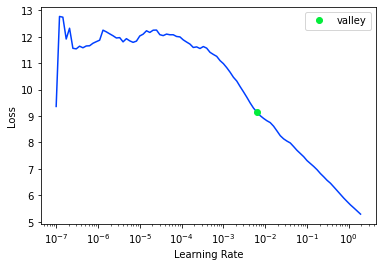

<Figure size 720x720 with 0 Axes>

XGBoost Predictions vs Actual==========
   actual  predicted
0    0.00       0.00
1    1.47       1.50
2    1.59       1.58
3    0.00       0.01
4    1.26       1.39
XGBoost RMSE:  0.12109486


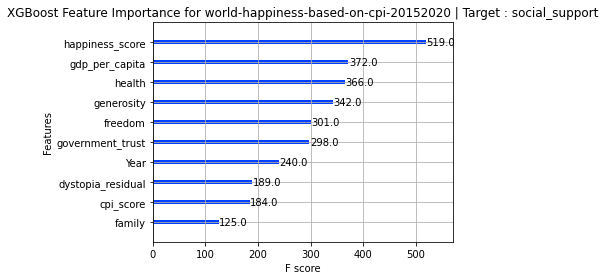

Target Variable: Year
CATS=====================
['Year']
CONTS=====================
['happiness_score', 'gdp_per_capita', 'family', 'health', 'freedom', 'generosity', 'government_trust', 'dystopia_residual', 'social_support', 'cpi_score']
11
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['happiness_score', 'gdp_per_capita', 'family', 'health', 'freedom', 'generosity', 'government_trust', 'dystopia_residual', 'social_support', 'cpi_score']
Categorical variables that made the cut : ['Year']
Tabular Object size: 792


  5%|▍         | 2/42 [00:00<00:02, 17.97it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.7887206591277858, 'Adjusted R-Squared': 0.7743479148507644, 'RMSE': 0.8227853748057348, 'Time taken': 0.06511664390563965}
{'Model': 'BaggingRegressor', 'R-Squared': 0.7526169848354148, 'Adjusted R-Squared': 0.7357882082936062, 'RMSE': 0.8903135559161733, 'Time taken': 0.04601788520812988}
{'Model': 'BayesianRidge', 'R-Squared': 0.7473919471474849, 'Adjusted R-Squared': 0.7302077258650008, 'RMSE': 0.899666692621241, 'Time taken': 0.011735200881958008}
{'Model': 'DecisionTreeRegressor', 'R-Squared': 0.5930940504319343, 'Adjusted R-Squared': 0.5654133735905693, 'RMSE': 1.1418395107695436, 'Time taken': 0.013010501861572266}
{'Model': 'DummyRegressor', 'R-Squared': -0.003823821857663834, 'Adjusted R-Squared': -0.07211115667791312, 'RMSE': 1.7934397679299476, 'Time taken': 0.009091377258300781}
{'Model': 'ElasticNet', 'R-Squared': 0.19543119661315211, 'Adjusted R-Squared': 0.14069862495418284, 'RMSE': 1.6056085, 'Time taken': 0.0135283470153808

 21%|██▏       | 9/42 [00:00<00:01, 23.74it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': 0.7945525934816037, 'Adjusted R-Squared': 0.7805765794327332, 'RMSE': 0.8113502575992252, 'Time taken': 0.19336223602294922}
{'Model': 'GammaRegressor', 'R-Squared': 0.39615998221764914, 'Adjusted R-Squared': 0.35508242998755724, 'RMSE': 1.390973936320696, 'Time taken': 0.015494108200073242}
{'Model': 'GaussianProcessRegressor', 'R-Squared': 0.5188352841395951, 'Adjusted R-Squared': 0.48610299054364914, 'RMSE': 1.2416664114671556, 'Time taken': 0.13259172439575195}


 29%|██▊       | 12/42 [00:00<00:02, 13.61it/s]

{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.8018938535244872, 'Adjusted R-Squared': 0.7884172449207107, 'RMSE': 0.7967223894632606, 'Time taken': 0.2553277015686035}


 43%|████▎     | 18/42 [00:01<00:02, 10.73it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.7843435360644953, 'Adjusted R-Squared': 0.7696730283137806, 'RMSE': 0.8312646010475235, 'Time taken': 0.6559863090515137}
{'Model': 'HuberRegressor', 'R-Squared': 0.7536998962950476, 'Adjusted R-Squared': 0.7369447871994727, 'RMSE': 0.8883627587271945, 'Time taken': 0.0229489803314209}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.5792671492330195, 'Adjusted R-Squared': 0.5506458668679187, 'RMSE': 1.1610776312645013, 'Time taken': 0.012907028198242188}
{'Model': 'KernelRidge', 'R-Squared': -3.2099467455036024, 'Adjusted R-Squared': -3.496337680571875, 'RMSE': 3.6727922, 'Time taken': 0.023996353149414062}
{'Model': 'Lars', 'R-Squared': 0.7488555532623815, 'Adjusted R-Squared': 0.7317708970217272, 'RMSE': 0.8970566, 'Time taken': 0.022987842559814453}
{'Model': 'LarsCV', 'R-Squared': 0.74513626420905, 'Adjusted R-Squared': 0.7277985951076248, 'RMSE': 0.9036746, 'Time taken': 0.04910731315612793}
{'Model': 'Lasso', 'R-Squared': 

 55%|█████▍    | 23/42 [00:01<00:01, 15.90it/s]

{'Model': 'LassoLars', 'R-Squared': -0.0038238162270924914, 'Adjusted R-Squared': -0.07211115066430973, 'RMSE': 1.7934397, 'Time taken': 0.013603448867797852}
{'Model': 'LassoLarsCV', 'R-Squared': 0.74513626420905, 'Adjusted R-Squared': 0.7277985951076248, 'RMSE': 0.9036746, 'Time taken': 0.025054216384887695}
{'Model': 'LassoLarsIC', 'R-Squared': 0.7465311123101395, 'Adjusted R-Squared': 0.7292883308346387, 'RMSE': 0.9011983, 'Time taken': 0.012747049331665039}
{'Model': 'LinearRegression', 'R-Squared': 0.7488559940886022, 'Adjusted R-Squared': 0.7317713678361261, 'RMSE': 0.8970558, 'Time taken': 0.011630535125732422}
{'Model': 'LinearSVR', 'R-Squared': 0.7502282502362352, 'Adjusted R-Squared': 0.7332369747421015, 'RMSE': 0.8946016706718999, 'Time taken': 0.014704704284667969}


 69%|██████▉   | 29/42 [00:03<00:01,  7.46it/s]

{'Model': 'MLPRegressor', 'R-Squared': 0.7429796656347813, 'Adjusted R-Squared': 0.7254952891473515, 'RMSE': 0.9074899, 'Time taken': 1.3337187767028809}
{'Model': 'NuSVR', 'R-Squared': 0.7294380504168403, 'Adjusted R-Squared': 0.7110324756152648, 'RMSE': 0.9310894517203626, 'Time taken': 0.10252094268798828}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.42427711938400026, 'Adjusted R-Squared': 0.38511229757338794, 'RMSE': 1.35820333211316, 'Time taken': 0.017551660537719727}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.7183302982624946, 'Adjusted R-Squared': 0.6991690940626643, 'RMSE': 0.9500098619876485, 'Time taken': 0.01738715171813965}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': 0.13093267778694317, 'Adjusted R-Squared': 0.07181245178605489, 'RMSE': 1.668724940568482, 'Time taken': 0.012360572814941406}
{'Model': 'PoissonRegressor', 'R-Squared': 0.5892310348237866, 'Adjusted R-Squared': 0.5612875678049964, 'RMSE': 1.1472468097878956, 'Time taken': 0.013

 76%|███████▌  | 32/42 [00:09<00:07,  1.39it/s]

{'Model': 'QuantileRegressor', 'R-Squared': -0.10812736751427043, 'Adjusted R-Squared': -0.1835101816308875, 'RMSE': 1.8843123179017776, 'Time taken': 6.616798400878906}
{'Model': 'RANSACRegressor', 'R-Squared': 0.6000324739687395, 'Adjusted R-Squared': 0.5728237987285176, 'RMSE': 1.1320626, 'Time taken': 0.1336534023284912}


 95%|█████████▌| 40/42 [00:10<00:00,  2.99it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.7943732388203377, 'Adjusted R-Squared': 0.7803850237741021, 'RMSE': 0.8117043329012312, 'Time taken': 0.34624218940734863}
{'Model': 'Ridge', 'R-Squared': 0.7481068417600598, 'Adjusted R-Squared': 0.7309712527641454, 'RMSE': 0.89839274, 'Time taken': 0.014723777770996094}
{'Model': 'RidgeCV', 'R-Squared': 0.7481068156068122, 'Adjusted R-Squared': 0.7309712248317655, 'RMSE': 0.8983927842952024, 'Time taken': 0.01217961311340332}
{'Model': 'SGDRegressor', 'R-Squared': 0.7450034712061915, 'Adjusted R-Squared': 0.7276567685671569, 'RMSE': 0.9039099791174002, 'Time taken': 0.012850284576416016}
{'Model': 'SVR', 'R-Squared': 0.7409004714952543, 'Adjusted R-Squared': 0.7232746532296253, 'RMSE': 0.9111531020565102, 'Time taken': 0.04499220848083496}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.7488559940886022, 'Adjusted R-Squared': 0.7317713678361261, 'RMSE': 0.8970558, 'Time taken': 0.012484312057495117}
{'Model': 'TweedieRegressor'

100%|██████████| 42/42 [00:11<00:00,  3.80it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.7627049440876117, 'Adjusted R-Squared': 0.7465624232772452, 'RMSE': 0.8719717, 'Time taken': 0.48724937438964844}
{'Model': 'LGBMRegressor', 'R-Squared': 0.7788138910511985, 'Adjusted R-Squared': 0.7637672169730487, 'RMSE': 0.8418543708944027, 'Time taken': 0.11002588272094727}
Project: world-happiness-based-on-cpi-20152020
world-happiness-based-on-cpi-20152020
Target: Year
Year
Target Standard Deviation: 1.685992977846766
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
GradientBoostingRegressor                    0.79       0.80  0.80        0.26
ExtraTreesRegressor                          0.78       0.79  0.81        0.19
RandomForestRegressor                        0.78       0.79  0.81        0.35
AdaBoostRegressor                            0.77       0.79  0.82        0.07
HistGradientBoostingRegressor                0.77       0.

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time
0,5.858182,17.085266,4.133433,00:00
1,4.539062,9.282184,3.046668,00:00
2,3.546548,5.330199,2.308722,00:00
3,2.828897,8.488748,2.913546,00:00


Better model found at epoch 0 with _rmse value: 4.133432865142822.
Better model found at epoch 1 with _rmse value: 3.04666805267334.
Better model found at epoch 2 with _rmse value: 2.308722496032715.
No improvement since epoch 2: early stopping


Could not show results
XGBoost Predictions vs Actual==========
   actual  predicted
0       1       1.01
1       2       2.54
2       6       5.89
3       2       1.47
4       2       4.85
XGBoost RMSE:  0.8715659


<Figure size 432x288 with 0 Axes>

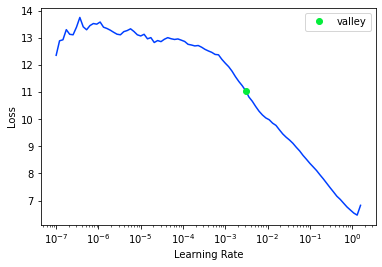

<Figure size 720x720 with 0 Axes>

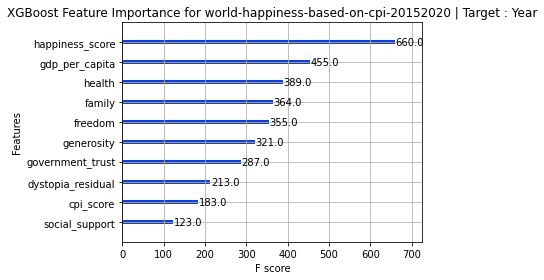

Target Variable: dystopia_residual
CATS=====================
['Year']
CONTS=====================
['happiness_score', 'gdp_per_capita', 'family', 'health', 'freedom', 'generosity', 'government_trust', 'social_support', 'cpi_score']
10
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['happiness_score', 'gdp_per_capita', 'family', 'health', 'freedom', 'generosity', 'government_trust', 'social_support', 'cpi_score']
Categorical variables that made the cut : ['Year']
Tabular Object size: 792


  2%|▏         | 1/42 [00:00<00:05,  7.39it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.9252725574186399, 'Adjusted R-Squared': 0.9201890579233093, 'RMSE': 0.2952147831746737, 'Time taken': 0.13490986824035645}


 14%|█▍        | 6/42 [00:00<00:01, 28.50it/s]

{'Model': 'BaggingRegressor', 'R-Squared': 0.949369642154974, 'Adjusted R-Squared': 0.9459254001247002, 'RMSE': 0.2429984705426999, 'Time taken': 0.05363655090332031}
{'Model': 'BayesianRidge', 'R-Squared': 0.7284133713784804, 'Adjusted R-Squared': 0.7099380905198736, 'RMSE': 0.5627975959558762, 'Time taken': 0.013951778411865234}
{'Model': 'DecisionTreeRegressor', 'R-Squared': 0.8843301757910562, 'Adjusted R-Squared': 0.8764614802666383, 'RMSE': 0.3672891333339397, 'Time taken': 0.01447606086730957}
{'Model': 'DummyRegressor', 'R-Squared': -0.007421534563720744, 'Adjusted R-Squared': -0.07595361174492621, 'RMSE': 1.0839361, 'Time taken': 0.010147571563720703}
{'Model': 'ElasticNet', 'R-Squared': 0.15099881524758252, 'Adjusted R-Squared': 0.09324363261136359, 'RMSE': 0.9950667, 'Time taken': 0.011608123779296875}
ElasticNetCV model failed to execute
Gram matrix passed in via 'precompute' parameter did not pass validation when a single element was checked - please check that it was comp

 24%|██▍       | 10/42 [00:00<00:01, 20.06it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': 0.9569647686002167, 'Adjusted R-Squared': 0.9540372018383267, 'RMSE': 0.22403202937329975, 'Time taken': 0.2039334774017334}
GammaRegressor model failed to execute
Some value(s) of y are out of the valid range for family GammaDistribution
{'Model': 'GaussianProcessRegressor', 'R-Squared': 0.8349023005344582, 'Adjusted R-Squared': 0.8236711645163941, 'RMSE': 0.43880195366301006, 'Time taken': 0.07701587677001953}
{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.9546259617573487, 'Adjusted R-Squared': 0.9515392924891412, 'RMSE': 0.23003915203134495, 'Time taken': 0.23183417320251465}


 43%|████▎     | 18/42 [00:01<00:01, 13.81it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.9723978784919228, 'Adjusted R-Squared': 0.9705201831512373, 'RMSE': 0.179419347670839, 'Time taken': 0.33429980278015137}
{'Model': 'HuberRegressor', 'R-Squared': 0.7150792142415814, 'Adjusted R-Squared': 0.6956968478634576, 'RMSE': 0.5764479623343276, 'Time taken': 0.023378372192382812}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.8720202499484828, 'Adjusted R-Squared': 0.8633141445028014, 'RMSE': 0.38633913, 'Time taken': 0.013364315032958984}
{'Model': 'KernelRidge', 'R-Squared': -1.0808879295721212, 'Adjusted R-Squared': -1.2224449315838304, 'RMSE': 1.5578383, 'Time taken': 0.02737569808959961}
{'Model': 'Lars', 'R-Squared': 0.7290189200544347, 'Adjusted R-Squared': 0.7105848329833078, 'RMSE': 0.56216985, 'Time taken': 0.027368783950805664}
{'Model': 'LarsCV', 'R-Squared': 0.7292154187424695, 'Adjusted R-Squared': 0.7107946989290321, 'RMSE': 0.561966, 'Time taken': 0.0557866096496582}
{'Model': 'Lasso', 'R-Squared': -0.00

 52%|█████▏    | 22/42 [00:01<00:01, 17.38it/s]

LassoCV model failed to execute
Gram matrix passed in via 'precompute' parameter did not pass validation when a single element was checked - please check that it was computed properly. For element (5,6) we computed 150.37850952148438 but the user-supplied value was 150.37847900390625.
{'Model': 'LassoLars', 'R-Squared': -0.007421534563720744, 'Adjusted R-Squared': -0.07595361174492621, 'RMSE': 1.0839361, 'Time taken': 0.011446475982666016}
{'Model': 'LassoLarsCV', 'R-Squared': 0.7292154187424695, 'Adjusted R-Squared': 0.7107946989290321, 'RMSE': 0.561966, 'Time taken': 0.02511143684387207}
{'Model': 'LassoLarsIC', 'R-Squared': 0.7295431432687185, 'Adjusted R-Squared': 0.7111447176407402, 'RMSE': 0.5616258, 'Time taken': 0.01400899887084961}
{'Model': 'LinearRegression', 'R-Squared': 0.7290198213961325, 'Adjusted R-Squared': 0.7105857956407673, 'RMSE': 0.5621689, 'Time taken': 0.0106658935546875}
{'Model': 'LinearSVR', 'R-Squared': 0.6234862215494528, 'Adjusted R-Squared': 0.59787303934

 67%|██████▋   | 28/42 [00:03<00:02,  6.69it/s]

{'Model': 'MLPRegressor', 'R-Squared': 0.9713778965489374, 'Adjusted R-Squared': 0.9694308146815181, 'RMSE': 0.18270431, 'Time taken': 1.5452539920806885}
{'Model': 'NuSVR', 'R-Squared': 0.9605823057314089, 'Adjusted R-Squared': 0.9579008299308245, 'RMSE': 0.21440931533810417, 'Time taken': 0.11648344993591309}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.3606823776314365, 'Adjusted R-Squared': 0.3171913829124866, 'RMSE': 0.8634881451039368, 'Time taken': 0.012140512466430664}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.7264040263943289, 'Adjusted R-Squared': 0.7077920554007457, 'RMSE': 0.5648757000321513, 'Time taken': 0.01822185516357422}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': -0.1538527124241793, 'Adjusted R-Squared': -0.23234609422174257, 'RMSE': 1.1600407069817398, 'Time taken': 0.011227846145629883}
{'Model': 'PoissonRegressor', 'R-Squared': 0.4631545424697121, 'Adjusted R-Squared': 0.42663444331799183, 'RMSE': 0.7912663245665728, 'Time taken': 

 79%|███████▊  | 33/42 [00:15<00:09,  1.02s/it]

{'Model': 'QuantileRegressor', 'R-Squared': -0.1722475130073009, 'Adjusted R-Squared': -0.2519922417833078, 'RMSE': 1.16925086987183, 'Time taken': 11.68137788772583}
{'Model': 'RANSACRegressor', 'R-Squared': 0.3539580686989613, 'Adjusted R-Squared': 0.31000963799821035, 'RMSE': 0.8680174, 'Time taken': 0.1456449031829834}


 83%|████████▎ | 35/42 [00:15<00:05,  1.23it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.9561657001610242, 'Adjusted R-Squared': 0.9531837750019102, 'RMSE': 0.22610235127249947, 'Time taken': 0.33564305305480957}
{'Model': 'Ridge', 'R-Squared': 0.7286896891222696, 'Adjusted R-Squared': 0.7102332053890906, 'RMSE': 0.5625112, 'Time taken': 0.012576818466186523}
{'Model': 'RidgeCV', 'R-Squared': 0.7286888801270326, 'Adjusted R-Squared': 0.7102323413601641, 'RMSE': 0.562512060902438, 'Time taken': 0.014779090881347656}
{'Model': 'SGDRegressor', 'R-Squared': 0.7207203630026342, 'Adjusted R-Squared': 0.7017217482409086, 'RMSE': 0.5707128844522323, 'Time taken': 0.012274980545043945}
{'Model': 'SVR', 'R-Squared': 0.9579710800793176, 'Adjusted R-Squared': 0.9551119698806317, 'RMSE': 0.22139721646955832, 'Time taken': 0.03929471969604492}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.7290198213961325, 'Adjusted R-Squared': 0.7105857956407673, 'RMSE': 0.5621689, 'Time taken': 0.012171745300292969}
{'Model': 'TweedieRegressor

100%|██████████| 42/42 [00:16<00:00,  2.62it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.9679470026596914, 'Adjusted R-Squared': 0.9657665266501465, 'RMSE': 0.19334473, 'Time taken': 0.4899613857269287}
{'Model': 'LGBMRegressor', 'R-Squared': 0.9711879043937792, 'Adjusted R-Squared': 0.9692278978899547, 'RMSE': 0.1833097078544977, 'Time taken': 0.10425829887390137}
Project: world-happiness-based-on-cpi-20152020
world-happiness-based-on-cpi-20152020
Target: dystopia_residual
dystopia_residual
Target Standard Deviation: 1.0724575519561768
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
HistGradientBoostingRegressor                0.97       0.97  0.18        0.33
MLPRegressor                                 0.97       0.97  0.18        1.55
LGBMRegressor                                0.97       0.97  0.18        0.10
XGBRegressor                                 0.97       0.97  0.19        0.49
NuSVR                          

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time
0,5.999873,16.711521,4.087973,00:00
1,4.446122,11.628202,3.410015,00:00
2,3.294314,5.672091,2.381615,00:00
3,2.596426,3.936706,1.984113,00:00
4,2.097886,1.457168,1.207132,00:00
5,1.672584,1.261728,1.123267,00:00
6,1.384840,0.966751,0.983235,00:00
7,1.174536,0.812996,0.901663,00:00
8,1.007853,0.919307,0.958805,00:00


Better model found at epoch 0 with _rmse value: 4.087973117828369.
Better model found at epoch 1 with _rmse value: 3.4100148677825928.
Better model found at epoch 2 with _rmse value: 2.381615161895752.
Better model found at epoch 3 with _rmse value: 1.9841132164001465.
Better model found at epoch 4 with _rmse value: 1.2071318626403809.
Better model found at epoch 5 with _rmse value: 1.1232668161392212.
Better model found at epoch 6 with _rmse value: 0.9832350611686707.
Better model found at epoch 7 with _rmse value: 0.9016627669334412.
No improvement since epoch 7: early stopping


,Year,happiness_score,gdp_per_capita,family,health,freedom,generosity,government_trust,social_support,cpi_score,dystopia_residual,dystopia_residual_pred
0,4.00,-0.25,0.24,-0.94,-0.21,0.04,-1.46,0.49,0.90,-1.00,0.00,0.09
1,2.00,-1.82,-1.83,0.46,-0.96,1.14,0.12,4.01,-0.93,0.49,0.67,2.28
2,5.00,-0.76,-1.46,0.20,-2.79,-0.79,0.22,-0.39,-0.93,-0.59,3.01,1.77
3,4.00,-1.67,-1.54,-0.94,-1.70,-2.29,-0.16,-0.82,-0.08,-1.46,0.00,1.08
4,5.00,-1.77,-1.55,0.18,-1.43,0.81,0.20,3.57,-0.93,0.44,0.97,0.90
5,2.00,0.83,1.19,1.02,0.29,-0.77,-0.60,1.89,-0.93,0.08,2.44,1.49
6,3.00,0.34,-0.75,-0.94,0.75,0.57,0.28,-0.43,1.02,-0.79,0.00,0.78
7,6.00,1.68,1.00,-0.94,1.43,1.54,0.50,2.98,1.33,2.07,2.25,1.83
8,4.00,-1.70,0.22,-0.94,-1.01,0.90,-1.38,-0.30,0.92,0.85,0.00,0.83


<Figure size 432x288 with 0 Axes>

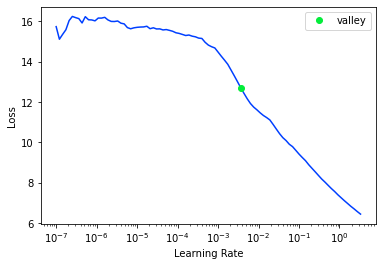

<Figure size 720x720 with 0 Axes>

XGBoost Predictions vs Actual==========
   actual  predicted
0    0.00       0.03
1    0.00       0.03
2    2.12       1.90
3    0.00       0.01
4    0.00      -0.00
XGBoost RMSE:  0.19330287


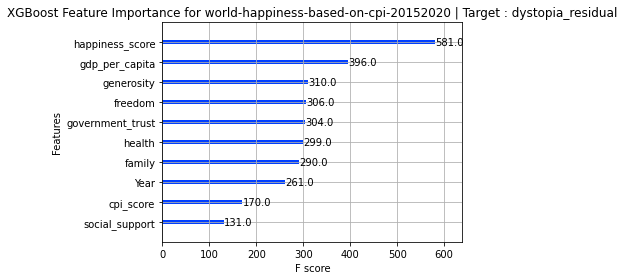

Target Variable: government_trust
CATS=====================
['Year']
CONTS=====================
['happiness_score', 'gdp_per_capita', 'family', 'health', 'freedom', 'generosity', 'dystopia_residual', 'social_support', 'cpi_score']
10
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['happiness_score', 'gdp_per_capita', 'family', 'health', 'freedom', 'generosity', 'dystopia_residual', 'social_support', 'cpi_score']
Categorical variables that made the cut : ['Year']
Tabular Object size: 792


  2%|▏         | 1/42 [00:00<00:05,  7.46it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.6832911603829046, 'Adjusted R-Squared': 0.6617463413613335, 'RMSE': 0.05949732967647083, 'Time taken': 0.13382220268249512}


 12%|█▏        | 5/42 [00:00<00:01, 23.44it/s]

{'Model': 'BaggingRegressor', 'R-Squared': 0.7226931650250387, 'Adjusted R-Squared': 0.7038287544825242, 'RMSE': 0.05567339028792068, 'Time taken': 0.06634354591369629}
{'Model': 'BayesianRidge', 'R-Squared': 0.4884492390435001, 'Adjusted R-Squared': 0.4536498675498607, 'RMSE': 0.07561566038597847, 'Time taken': 0.012312650680541992}
{'Model': 'DecisionTreeRegressor', 'R-Squared': 0.6092180010077533, 'Adjusted R-Squared': 0.5826341915524984, 'RMSE': 0.06608983337795102, 'Time taken': 0.01667952537536621}
{'Model': 'DummyRegressor', 'R-Squared': -0.0005389272198488282, 'Adjusted R-Squared': -0.06860279981983863, 'RMSE': 0.10575098, 'Time taken': 0.009819746017456055}
{'Model': 'ElasticNet', 'R-Squared': -0.0005389272198488282, 'Adjusted R-Squared': -0.06860279981983863, 'RMSE': 0.10575098, 'Time taken': 0.01374959945678711}
ElasticNetCV model failed to execute
Gram matrix passed in via 'precompute' parameter did not pass validation when a single element was checked - please check that i

 21%|██▏       | 9/42 [00:00<00:01, 16.55it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': 0.7778662480064287, 'Adjusted R-Squared': 0.7627551084150292, 'RMSE': 0.049828137933501666, 'Time taken': 0.2639894485473633}
GammaRegressor model failed to execute
Some value(s) of y are out of the valid range for family GammaDistribution
{'Model': 'GaussianProcessRegressor', 'R-Squared': 0.5688326559148771, 'Adjusted R-Squared': 0.5395015440723516, 'RMSE': 0.06942091158555239, 'Time taken': 0.06862926483154297}


 29%|██▊       | 12/42 [00:00<00:02, 12.69it/s]

{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.772634409689917, 'Adjusted R-Squared': 0.7571673627300475, 'RMSE': 0.05041151522884775, 'Time taken': 0.25272417068481445}


 43%|████▎     | 18/42 [00:01<00:01, 13.28it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.7149004712228555, 'Adjusted R-Squared': 0.6955059454557028, 'RMSE': 0.05645021906621908, 'Time taken': 0.3305091857910156}
{'Model': 'HuberRegressor', 'R-Squared': 0.4980952778772588, 'Adjusted R-Squared': 0.46395209950156213, 'RMSE': 0.07489934551096958, 'Time taken': 0.02631974220275879}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.6269844625215739, 'Adjusted R-Squared': 0.6016092558903885, 'RMSE': 0.06457001, 'Time taken': 0.013370752334594727}
{'Model': 'KernelRidge', 'R-Squared': -0.7658537261298162, 'Adjusted R-Squared': -0.8859798299481711, 'RMSE': 0.14048979, 'Time taken': 0.04312586784362793}
{'Model': 'Lars', 'R-Squared': 0.47998000868850743, 'Adjusted R-Squared': 0.4446044990754807, 'RMSE': 0.076239035, 'Time taken': 0.026406526565551758}
{'Model': 'LarsCV', 'R-Squared': 0.48418702988417084, 'Adjusted R-Squared': 0.44909771218921646, 'RMSE': 0.07593002, 'Time taken': 0.054680585861206055}


 55%|█████▍    | 23/42 [00:01<00:00, 19.32it/s]

{'Model': 'Lasso', 'R-Squared': -0.0005389272198488282, 'Adjusted R-Squared': -0.06860279981983863, 'RMSE': 0.10575098, 'Time taken': 0.032605886459350586}
LassoCV model failed to execute
Gram matrix passed in via 'precompute' parameter did not pass validation when a single element was checked - please check that it was computed properly. For element (5,6) we computed 137.43658447265625 but the user-supplied value was 137.43663024902344.
{'Model': 'LassoLars', 'R-Squared': -0.0005389272198488282, 'Adjusted R-Squared': -0.06860279981983863, 'RMSE': 0.10575098, 'Time taken': 0.011129140853881836}
{'Model': 'LassoLarsCV', 'R-Squared': 0.4864200346805151, 'Adjusted R-Squared': 0.45148262207374734, 'RMSE': 0.07576548, 'Time taken': 0.028661489486694336}
{'Model': 'LassoLarsIC', 'R-Squared': 0.4864056015124729, 'Adjusted R-Squared': 0.45146720705753907, 'RMSE': 0.07576655, 'Time taken': 0.01445770263671875}
{'Model': 'LinearRegression', 'R-Squared': 0.48634046838416334, 'Adjusted R-Squared':

 69%|██████▉   | 29/42 [00:01<00:00, 15.59it/s]

{'Model': 'MLPRegressor', 'R-Squared': 0.4491103709436529, 'Adjusted R-Squared': 0.41163488597383335, 'RMSE': 0.078469284, 'Time taken': 0.2739298343658447}
{'Model': 'NuSVR', 'R-Squared': 0.783486086402267, 'Adjusted R-Squared': 0.7687572487425572, 'RMSE': 0.04919379046478374, 'Time taken': 0.1424422264099121}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.38824583049160677, 'Adjusted R-Squared': 0.3466299005930765, 'RMSE': 0.0826905443523507, 'Time taken': 0.011238813400268555}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.45977046631541296, 'Adjusted R-Squared': 0.4230201579014954, 'RMSE': 0.07770635597986163, 'Time taken': 0.018209457397460938}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': 0.24598267714111866, 'Adjusted R-Squared': 0.19468898170854165, 'RMSE': 0.09180324732741177, 'Time taken': 0.012955904006958008}
{'Model': 'PoissonRegressor', 'R-Squared': 0.21136123287349728, 'Adjusted R-Squared': 0.15771233715060584, 'RMSE': 0.09388721200797795, 'Time ta

 79%|███████▊  | 33/42 [00:14<00:09,  1.05s/it]

{'Model': 'QuantileRegressor', 'R-Squared': -0.10806757451347626, 'Adjusted R-Squared': -0.18344632107901893, 'RMSE': 0.11128855539965282, 'Time taken': 11.912496566772461}
{'Model': 'RANSACRegressor', 'R-Squared': -110.43337142010934, 'Adjusted R-Squared': -118.01387287725964, 'RMSE': 1.1160277, 'Time taken': 0.12374138832092285}


 83%|████████▎ | 35/42 [00:14<00:05,  1.18it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.7694634010744953, 'Adjusted R-Squared': 0.7537806392428283, 'RMSE': 0.05076183613015775, 'Time taken': 0.48673510551452637}
{'Model': 'Ridge', 'R-Squared': 0.48670571043115507, 'Adjusted R-Squared': 0.4517877315489207, 'RMSE': 0.075744405, 'Time taken': 0.01254582405090332}
{'Model': 'RidgeCV', 'R-Squared': 0.48670570341019714, 'Adjusted R-Squared': 0.4517877240503466, 'RMSE': 0.07574441246878948, 'Time taken': 0.013543128967285156}
{'Model': 'SGDRegressor', 'R-Squared': 0.4851026769192287, 'Adjusted R-Squared': 0.45007564813822376, 'RMSE': 0.0758625957886531, 'Time taken': 0.016998767852783203}
{'Model': 'SVR', 'R-Squared': 0.600746116777186, 'Adjusted R-Squared': 0.5735859886667904, 'RMSE': 0.06680238319176296, 'Time taken': 0.023507118225097656}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.48634046838416334, 'Adjusted R-Squared': 0.4513976431041744, 'RMSE': 0.075771354, 'Time taken': 0.016650676727294922}
{'Model': 'Tweedie

100%|██████████| 42/42 [00:15<00:00,  2.76it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.7290802408283547, 'Adjusted R-Squared': 0.7106503252384468, 'RMSE': 0.055028506, 'Time taken': 0.4866328239440918}
{'Model': 'LGBMRegressor', 'R-Squared': 0.710621419423744, 'Adjusted R-Squared': 0.690935801697468, 'RMSE': 0.05687227129455529, 'Time taken': 0.10087299346923828}
Project: world-happiness-based-on-cpi-20152020
world-happiness-based-on-cpi-20152020
Target: government_trust
government_trust
Target Standard Deviation: 0.10975046455860138
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
NuSVR                                        0.77       0.78  0.05        0.14
ExtraTreesRegressor                          0.76       0.78  0.05        0.26
GradientBoostingRegressor                    0.76       0.77  0.05        0.25
RandomForestRegressor                        0.75       0.77  0.05        0.49
XGBRegressor                    

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time
0,2.989992,26.604332,5.157939,00:00
1,2.299370,7.673670,2.770139,00:00
2,1.694940,1.312287,1.145551,00:00
3,1.210277,1.098042,1.047875,00:00
4,0.901355,0.102319,0.319873,00:00
5,0.691322,0.053483,0.231263,00:00
6,0.536605,0.022563,0.150209,00:00
7,0.424078,0.010957,0.104674,00:00
8,0.339348,0.011868,0.108939,00:00


Better model found at epoch 0 with _rmse value: 5.1579389572143555.
Better model found at epoch 1 with _rmse value: 2.770139217376709.
Better model found at epoch 2 with _rmse value: 1.1455508470535278.
Better model found at epoch 3 with _rmse value: 1.0478748083114624.
Better model found at epoch 4 with _rmse value: 0.31987324357032776.
Better model found at epoch 5 with _rmse value: 0.23126311600208282.
Better model found at epoch 6 with _rmse value: 0.15020851790905.
Better model found at epoch 7 with _rmse value: 0.1046738550066948.
No improvement since epoch 7: early stopping


,Year,happiness_score,gdp_per_capita,family,health,freedom,generosity,dystopia_residual,social_support,cpi_score,government_trust,government_trust_pred
0,5.00,-0.57,0.51,-0.19,-0.01,-1.35,1.44,0.58,-0.97,-0.92,0.06,0.06
1,6.00,0.70,-0.58,-0.90,0.31,1.79,1.26,0.65,1.28,-0.92,0.28,0.18
2,5.00,0.91,1.00,1.09,0.68,0.83,2.92,0.57,-0.97,0.51,0.18,0.11
3,5.00,1.46,1.37,1.07,0.69,0.79,0.97,1.22,-0.97,1.69,0.21,0.19
4,3.00,0.31,0.65,-0.90,0.36,-0.11,-0.56,-1.27,1.39,-0.66,0.10,0.08
5,5.00,-0.29,0.52,0.27,0.50,-1.10,0.20,0.65,-0.97,-0.82,0.03,0.06
6,6.00,0.21,-0.78,-0.90,-0.75,-0.14,0.13,1.48,0.40,-0.66,0.12,0.08
7,1.00,-1.18,-0.65,0.69,-1.50,-0.02,0.37,0.19,-0.97,0.16,0.03,0.11
8,4.00,1.28,1.69,-0.90,1.08,1.38,-0.14,-1.27,1.41,1.89,0.32,0.20


<Figure size 432x288 with 0 Axes>

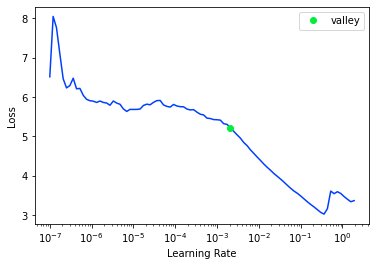

<Figure size 720x720 with 0 Axes>

XGBoost Predictions vs Actual==========
   actual  predicted
0    0.28       0.11
1    0.06       0.07
2    0.44       0.40
3    0.06       0.11
4    0.05       0.12
XGBoost RMSE:  0.055025775


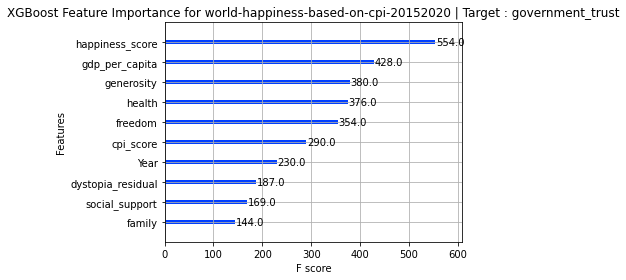

Target Variable: generosity
CATS=====================
['Year']
CONTS=====================
['happiness_score', 'gdp_per_capita', 'family', 'health', 'freedom', 'government_trust', 'dystopia_residual', 'social_support', 'cpi_score']
10
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['happiness_score', 'gdp_per_capita', 'family', 'health', 'freedom', 'government_trust', 'dystopia_residual', 'social_support', 'cpi_score']
Categorical variables that made the cut : ['Year']
Tabular Object size: 792


  2%|▏         | 1/42 [00:00<00:05,  7.30it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.28460213604173334, 'Adjusted R-Squared': 0.23593561468402813, 'RMSE': 0.09624802733184981, 'Time taken': 0.1367952823638916}


 12%|█▏        | 5/42 [00:00<00:01, 23.42it/s]

{'Model': 'BaggingRegressor', 'R-Squared': 0.37562821375738564, 'Adjusted R-Squared': 0.33315394258441866, 'RMSE': 0.089916553627063, 'Time taken': 0.06267380714416504}
{'Model': 'BayesianRidge', 'R-Squared': 0.2567176167020836, 'Adjusted R-Squared': 0.20615418926685114, 'RMSE': 0.09810585733515198, 'Time taken': 0.013511896133422852}
{'Model': 'DecisionTreeRegressor', 'R-Squared': -0.04577711049184141, 'Adjusted R-Squared': -0.11691841052530005, 'RMSE': 0.11636907536160217, 'Time taken': 0.016669034957885742}
{'Model': 'DummyRegressor', 'R-Squared': -0.004301301984050321, 'Adjusted R-Squared': -0.07262111844555053, 'RMSE': 0.11403812, 'Time taken': 0.010484457015991211}
{'Model': 'ElasticNet', 'R-Squared': -0.004301301984050321, 'Adjusted R-Squared': -0.07262111844555053, 'RMSE': 0.11403812, 'Time taken': 0.012077808380126953}
ElasticNetCV model failed to execute
Gram matrix passed in via 'precompute' parameter did not pass validation when a single element was checked - please check t

 21%|██▏       | 9/42 [00:00<00:02, 15.84it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': 0.4643000798041176, 'Adjusted R-Squared': 0.4278579083622208, 'RMSE': 0.08328730479626505, 'Time taken': 0.2583644390106201}
GammaRegressor model failed to execute
Some value(s) of y are out of the valid range for family GammaDistribution
{'Model': 'GaussianProcessRegressor', 'R-Squared': 0.24206581574568453, 'Adjusted R-Squared': 0.1905056671569555, 'RMSE': 0.09906808430842116, 'Time taken': 0.06877446174621582}


 29%|██▊       | 12/42 [00:00<00:02, 12.21it/s]

{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.4291451044561154, 'Adjusted R-Squared': 0.39031143809258584, 'RMSE': 0.08597672191261885, 'Time taken': 0.2630143165588379}


 40%|████      | 17/42 [00:01<00:02, 11.90it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.46404581901987607, 'Adjusted R-Squared': 0.42758635092599007, 'RMSE': 0.08330706789725113, 'Time taken': 0.3344728946685791}
{'Model': 'HuberRegressor', 'R-Squared': 0.26359856481631794, 'Adjusted R-Squared': 0.21350322908953678, 'RMSE': 0.09765069322074357, 'Time taken': 0.028504133224487305}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.20994848085237494, 'Adjusted R-Squared': 0.1562034795498154, 'RMSE': 0.101145305, 'Time taken': 0.014569520950317383}
{'Model': 'KernelRidge', 'R-Squared': -3.4161665398817673, 'Adjusted R-Squared': -3.7165860323907314, 'RMSE': 0.23913366, 'Time taken': 0.04775881767272949}
{'Model': 'Lars', 'R-Squared': 0.26609325826527086, 'Adjusted R-Squared': 0.21616762957583346, 'RMSE': 0.09748515, 'Time taken': 0.05374646186828613}


 48%|████▊     | 20/42 [00:01<00:01, 14.58it/s]

{'Model': 'LarsCV', 'R-Squared': 0.18291627526877663, 'Adjusted R-Squared': 0.12733234841631236, 'RMSE': 0.102861136, 'Time taken': 0.06926727294921875}
{'Model': 'Lasso', 'R-Squared': -0.004301301984050321, 'Adjusted R-Squared': -0.07262111844555053, 'RMSE': 0.11403812, 'Time taken': 0.011929035186767578}
LassoCV model failed to execute
Gram matrix passed in via 'precompute' parameter did not pass validation when a single element was checked - please check that it was computed properly. For element (5,6) we computed 238.15298461914062 but the user-supplied value was 238.1530303955078.
{'Model': 'LassoLars', 'R-Squared': -0.004301301984050321, 'Adjusted R-Squared': -0.07262111844555053, 'RMSE': 0.11403812, 'Time taken': 0.013454198837280273}
{'Model': 'LassoLarsCV', 'R-Squared': 0.26609325826527086, 'Adjusted R-Squared': 0.21616762957583346, 'RMSE': 0.09748515, 'Time taken': 0.026864051818847656}
{'Model': 'LassoLarsIC', 'R-Squared': 0.26609325826527086, 'Adjusted R-Squared': 0.2161676

 67%|██████▋   | 28/42 [00:02<00:00, 15.10it/s]

{'Model': 'MLPRegressor', 'R-Squared': 0.14224306603258152, 'Adjusted R-Squared': 0.08389225419806323, 'RMSE': 0.105390176, 'Time taken': 0.26427435874938965}
{'Model': 'NuSVR', 'R-Squared': 0.5818507890943814, 'Adjusted R-Squared': 0.5534052645429788, 'RMSE': 0.07358404508901584, 'Time taken': 0.1329631805419922}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.10203722394469539, 'Adjusted R-Squared': 0.0409513208116814, 'RMSE': 0.10783188186502458, 'Time taken': 0.011567354202270508}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.18689535600929363, 'Adjusted R-Squared': 0.1315821149214904, 'RMSE': 0.10261036638511457, 'Time taken': 0.021267175674438477}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': -0.77646669658247, 'Adjusted R-Squared': -0.8973147711799172, 'RMSE': 0.15166890546989156, 'Time taken': 0.011823415756225586}
{'Model': 'PoissonRegressor', 'R-Squared': 0.09787314810094849, 'Adjusted R-Squared': 0.036503974502373526, 'RMSE': 0.10808161425678002, 'Time

 76%|███████▌  | 32/42 [00:10<00:07,  1.32it/s]

{'Model': 'QuantileRegressor', 'R-Squared': -0.0487883401324416, 'Adjusted R-Squared': -0.12013448571968266, 'RMSE': 0.11653649254871447, 'Time taken': 8.105647325515747}
{'Model': 'RANSACRegressor', 'R-Squared': -93.73264971574984, 'Adjusted R-Squared': -100.17704765559678, 'RMSE': 1.1075615, 'Time taken': 0.1427617073059082}


 81%|████████  | 34/42 [00:10<00:05,  1.51it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.4889483237437262, 'Adjusted R-Squared': 0.45418290359023816, 'RMSE': 0.08134866423796533, 'Time taken': 0.4254567623138428}
{'Model': 'Ridge', 'R-Squared': 0.2654532842495684, 'Adjusted R-Squared': 0.21548411991280425, 'RMSE': 0.097527646, 'Time taken': 0.011633157730102539}
{'Model': 'RidgeCV', 'R-Squared': 0.25988461398923113, 'Adjusted R-Squared': 0.2095366285463216, 'RMSE': 0.09789662820586206, 'Time taken': 0.010952472686767578}
{'Model': 'SGDRegressor', 'R-Squared': 0.21984082066952582, 'Adjusted R-Squared': 0.1667687676538473, 'RMSE': 0.10051008238020029, 'Time taken': 0.010992050170898438}
{'Model': 'SVR', 'R-Squared': 0.4379168550629553, 'Adjusted R-Squared': 0.3996799064277822, 'RMSE': 0.0853136059689456, 'Time taken': 0.028613805770874023}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.2660940598619669, 'Adjusted R-Squared': 0.2161684857029169, 'RMSE': 0.097485095, 'Time taken': 0.011461734771728516}
{'Model': 'Tweedi

100%|██████████| 42/42 [00:11<00:00,  3.68it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.49116802963764605, 'Adjusted R-Squared': 0.45655360988510496, 'RMSE': 0.0811718, 'Time taken': 0.4823336601257324}
{'Model': 'LGBMRegressor', 'R-Squared': 0.4691255501098497, 'Adjusted R-Squared': 0.43301164195405706, 'RMSE': 0.08291133911232461, 'Time taken': 0.10569262504577637}
Project: world-happiness-based-on-cpi-20152020
world-happiness-based-on-cpi-20152020
Target: generosity
generosity
Target Standard Deviation: 0.12340308725833893
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
NuSVR                                        0.55       0.58  0.07        0.13
XGBRegressor                                 0.46       0.49  0.08        0.48
RandomForestRegressor                        0.45       0.49  0.08        0.43
LGBMRegressor                                0.43       0.47  0.08        0.11
ExtraTreesRegressor                      

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time
0,5.099288,47.712734,6.907440,00:00
1,3.393342,6.262813,2.502561,00:00
2,2.635005,8.392561,2.896992,00:00


Better model found at epoch 0 with _rmse value: 6.907440185546875.
Better model found at epoch 1 with _rmse value: 2.502561330795288.
No improvement since epoch 1: early stopping


,Year,happiness_score,gdp_per_capita,family,health,freedom,government_trust,dystopia_residual,social_support,cpi_score,generosity,generosity_pred
0,6.00,0.59,0.71,-0.90,1.62,0.19,-0.68,0.61,0.82,0.62,0.23,0.81
1,2.00,0.41,1.00,1.28,0.40,0.16,1.63,0.34,-0.97,-0.09,0.17,1.23
2,1.00,0.06,0.57,1.69,-0.08,-0.96,0.27,0.33,-0.97,-0.65,0.16,1.57
3,5.00,-1.04,-1.09,0.47,-1.54,-0.19,-0.54,0.48,-0.97,-0.86,0.41,3.63
4,5.00,0.44,-0.53,1.20,-0.67,1.23,1.43,0.91,-0.97,-1.01,0.34,-0.11
5,3.00,-0.07,0.20,-0.90,0.54,0.45,-0.23,-1.28,1.21,-0.81,0.11,3.09
6,1.00,-1.57,0.48,1.29,-1.36,0.51,-0.25,-0.93,-0.97,0.93,0.10,1.18
7,4.00,-2.35,-2.22,-0.90,-2.22,-2.57,-0.46,-1.28,0.00,-1.42,0.15,1.10
8,3.00,1.57,1.14,-0.90,1.57,0.70,0.91,-1.28,1.33,1.54,0.24,0.36


<Figure size 432x288 with 0 Axes>

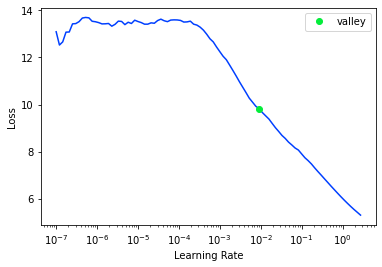

<Figure size 720x720 with 0 Axes>

XGBoost Predictions vs Actual==========
   actual  predicted
0    0.21       0.39
1    0.00       0.10
2    0.07       0.11
3    0.12       0.16
4    0.34       0.29
XGBoost RMSE:  0.08117716


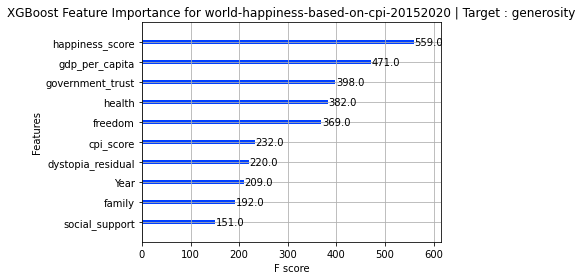

Target Variable: freedom
CATS=====================
['Year']
CONTS=====================
['happiness_score', 'gdp_per_capita', 'family', 'health', 'generosity', 'government_trust', 'dystopia_residual', 'social_support', 'cpi_score']
10
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['happiness_score', 'gdp_per_capita', 'family', 'health', 'generosity', 'government_trust', 'dystopia_residual', 'social_support', 'cpi_score']
Categorical variables that made the cut : ['Year']
Tabular Object size: 792


  2%|▏         | 1/42 [00:00<00:05,  7.73it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.42814219450919044, 'Adjusted R-Squared': 0.3892403029792033, 'RMSE': 0.1150039723829522, 'Time taken': 0.12921476364135742}


 14%|█▍        | 6/42 [00:00<00:01, 28.72it/s]

{'Model': 'BaggingRegressor', 'R-Squared': 0.472767960157213, 'Adjusted R-Squared': 0.43690183499783974, 'RMSE': 0.11042558590312833, 'Time taken': 0.05837726593017578}
{'Model': 'BayesianRidge', 'R-Squared': 0.42746809567964505, 'Adjusted R-Squared': 0.3885203470864236, 'RMSE': 0.11507173504160138, 'Time taken': 0.012568473815917969}
{'Model': 'DecisionTreeRegressor', 'R-Squared': 0.17440930945087185, 'Adjusted R-Squared': 0.11824667744072703, 'RMSE': 0.13818191548779352, 'Time taken': 0.014710664749145508}
{'Model': 'DummyRegressor', 'R-Squared': -0.01259688133352177, 'Adjusted R-Squared': -0.08148102292083625, 'RMSE': 0.15303372, 'Time taken': 0.009752273559570312}
{'Model': 'ElasticNet', 'R-Squared': -0.01259688133352177, 'Adjusted R-Squared': -0.08148102292083625, 'RMSE': 0.15303372, 'Time taken': 0.010414600372314453}
{'Model': 'ElasticNetCV', 'R-Squared': 0.42671453486104105, 'Adjusted R-Squared': 0.38771552362709827, 'RMSE': 0.115147434, 'Time taken': 0.07120418548583984}
{'Mod

 24%|██▍       | 10/42 [00:00<00:01, 16.24it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': 0.617277913155563, 'Adjusted R-Squared': 0.5912423970436965, 'RMSE': 0.09408287453839893, 'Time taken': 0.2592337131500244}
GammaRegressor model failed to execute
Some value(s) of y are out of the valid range for family GammaDistribution
{'Model': 'GaussianProcessRegressor', 'R-Squared': 0.1985074013644984, 'Adjusted R-Squared': 0.14398409533487233, 'RMSE': 0.13615029075912558, 'Time taken': 0.08142685890197754}
{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.5686528376289157, 'Adjusted R-Squared': 0.5393094932499304, 'RMSE': 0.09988086336505178, 'Time taken': 0.2522566318511963}


 40%|████      | 17/42 [00:01<00:02, 12.38it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.5949350623912925, 'Adjusted R-Squared': 0.5673796244587272, 'RMSE': 0.09679014516013154, 'Time taken': 0.3168187141418457}
{'Model': 'HuberRegressor', 'R-Squared': 0.41623082144562484, 'Adjusted R-Squared': 0.3765186324283204, 'RMSE': 0.11619552321631589, 'Time taken': 0.027515172958374023}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.42307088794981573, 'Adjusted R-Squared': 0.3838240095790548, 'RMSE': 0.11551277, 'Time taken': 0.012797117233276367}
{'Model': 'KernelRidge', 'R-Squared': -7.347647768599359, 'Adjusted R-Squared': -7.915514963742172, 'RMSE': 0.4393907, 'Time taken': 0.04392886161804199}
{'Model': 'Lars', 'R-Squared': 0.4266395850744249, 'Adjusted R-Squared': 0.3876354752155422, 'RMSE': 0.11515497, 'Time taken': 0.02557086944580078}
{'Model': 'LarsCV', 'R-Squared': 0.4266961630759992, 'Adjusted R-Squared': 0.387695902060761, 'RMSE': 0.11514928, 'Time taken': 0.051697492599487305}
{'Model': 'Lasso', 'R-Squared': -

 48%|████▊     | 20/42 [00:01<00:01, 13.86it/s]

{'Model': 'LassoCV', 'R-Squared': 0.4267025082895127, 'Adjusted R-Squared': 0.38770267892145227, 'RMSE': 0.11514865, 'Time taken': 0.08033204078674316}
{'Model': 'LassoLars', 'R-Squared': -0.01259688133352177, 'Adjusted R-Squared': -0.08148102292083625, 'RMSE': 0.15303372, 'Time taken': 0.012534618377685547}
{'Model': 'LassoLarsCV', 'R-Squared': 0.4266961630759992, 'Adjusted R-Squared': 0.387695902060761, 'RMSE': 0.11514928, 'Time taken': 0.02574920654296875}
{'Model': 'LassoLarsIC', 'R-Squared': 0.42665221650469176, 'Adjusted R-Squared': 0.38764896592677955, 'RMSE': 0.1151537, 'Time taken': 0.014124155044555664}
{'Model': 'LinearRegression', 'R-Squared': 0.42663946461543645, 'Adjusted R-Squared': 0.3876353465620648, 'RMSE': 0.11515498, 'Time taken': 0.010753393173217773}
{'Model': 'LinearSVR', 'R-Squared': 0.39737940458524645, 'Adjusted R-Squared': 0.3563848062577122, 'RMSE': 0.11805674370532522, 'Time taken': 0.030157089233398438}


 67%|██████▋   | 28/42 [00:02<00:00, 14.10it/s]

{'Model': 'MLPRegressor', 'R-Squared': 0.3494639679194653, 'Adjusted R-Squared': 0.30520981607725206, 'RMSE': 0.122660436, 'Time taken': 0.32112789154052734}
{'Model': 'NuSVR', 'R-Squared': 0.6501856073253891, 'Adjusted R-Squared': 0.6263887098645312, 'RMSE': 0.08994720071689022, 'Time taken': 0.1286311149597168}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.23688802616402693, 'Adjusted R-Squared': 0.1849756469915117, 'RMSE': 0.13285042529225857, 'Time taken': 0.011325836181640625}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.41009557106574, 'Adjusted R-Squared': 0.3699660180770148, 'RMSE': 0.11680451849021023, 'Time taken': 0.02007460594177246}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': 0.22045230921717285, 'Adjusted R-Squared': 0.16742185406187837, 'RMSE': 0.13427345370264318, 'Time taken': 0.01105952262878418}
{'Model': 'PoissonRegressor', 'R-Squared': 0.26469735090770985, 'Adjusted R-Squared': 0.21467676253408463, 'RMSE': 0.13040729313201596, 'Time take

 76%|███████▌  | 32/42 [00:11<00:08,  1.18it/s]

{'Model': 'QuantileRegressor', 'R-Squared': -0.04135712115433132, 'Adjusted R-Squared': -0.1121977416410207, 'RMSE': 0.15519176080033875, 'Time taken': 9.417339563369751}
{'Model': 'RANSACRegressor', 'R-Squared': -47.30814976448846, 'Adjusted R-Squared': -50.59441845595027, 'RMSE': 1.0570098, 'Time taken': 0.1530919075012207}


 81%|████████  | 34/42 [00:12<00:05,  1.35it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.5615864975873623, 'Adjusted R-Squared': 0.5317624498041897, 'RMSE': 0.10069566530003257, 'Time taken': 0.43415164947509766}
{'Model': 'Ridge', 'R-Squared': 0.4269141902249508, 'Adjusted R-Squared': 0.3879287609885529, 'RMSE': 0.11512738, 'Time taken': 0.013013362884521484}
{'Model': 'RidgeCV', 'R-Squared': 0.42691426047046577, 'Adjusted R-Squared': 0.38792883601267425, 'RMSE': 0.11512737855510927, 'Time taken': 0.012010574340820312}
{'Model': 'SGDRegressor', 'R-Squared': 0.42524209595385, 'Adjusted R-Squared': 0.38614291880785334, 'RMSE': 0.11529521704721385, 'Time taken': 0.01153707504272461}
{'Model': 'SVR', 'R-Squared': 0.5251230862569318, 'Adjusted R-Squared': 0.49281853430162104, 'RMSE': 0.1047995320426817, 'Time taken': 0.03146505355834961}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.42663946461543645, 'Adjusted R-Squared': 0.3876353465620648, 'RMSE': 0.11515498, 'Time taken': 0.011992454528808594}
{'Model': 'TweedieReg

100%|██████████| 42/42 [00:12<00:00,  3.28it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.5920151837762931, 'Adjusted R-Squared': 0.5642611146454287, 'RMSE': 0.097138375, 'Time taken': 0.4829535484313965}
{'Model': 'LGBMRegressor', 'R-Squared': 0.6037601104801686, 'Adjusted R-Squared': 0.57680501595501, 'RMSE': 0.09572996761071155, 'Time taken': 0.09799551963806152}
Project: world-happiness-based-on-cpi-20152020
world-happiness-based-on-cpi-20152020
Target: freedom
freedom
Target Standard Deviation: 0.1466546505689621
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
NuSVR                                        0.63       0.65  0.09        0.13
ExtraTreesRegressor                          0.59       0.62  0.09        0.26
LGBMRegressor                                0.58       0.60  0.10        0.10
HistGradientBoostingRegressor                0.57       0.59  0.10        0.32
XGBRegressor                                 0.56  

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time
0,1.808520,12.290784,3.505821,00:00
1,1.561084,6.678668,2.584312,00:00
2,1.364061,4.697955,2.167477,00:00
3,1.027642,0.783155,0.884961,00:00
4,0.764236,0.173855,0.416960,00:00
5,0.582186,0.061749,0.248494,00:00
6,0.455212,0.042149,0.205303,00:00
7,0.361615,0.038207,0.195466,00:00
8,0.291496,0.031926,0.178678,00:00
9,0.237363,0.032375,0.179930,00:00


Better model found at epoch 0 with _rmse value: 3.505821466445923.
Better model found at epoch 1 with _rmse value: 2.5843117237091064.
Better model found at epoch 2 with _rmse value: 2.1674766540527344.
Better model found at epoch 3 with _rmse value: 0.8849605321884155.
Better model found at epoch 4 with _rmse value: 0.4169595241546631.
Better model found at epoch 5 with _rmse value: 0.2484937161207199.
Better model found at epoch 6 with _rmse value: 0.2053026258945465.
Better model found at epoch 7 with _rmse value: 0.19546593725681305.
Better model found at epoch 8 with _rmse value: 0.17867785692214966.
No improvement since epoch 8: early stopping


,Year,happiness_score,gdp_per_capita,family,health,generosity,government_trust,dystopia_residual,social_support,cpi_score,freedom,freedom_pred
0,4.00,-0.94,-0.12,-0.91,-0.40,-1.00,-0.17,-1.26,0.63,-0.48,0.31,0.23
1,2.00,1.25,1.28,1.12,0.69,0.39,2.36,0.84,-0.96,1.08,0.64,0.45
2,5.00,1.23,1.98,0.97,0.84,0.48,2.07,0.71,-0.96,1.78,0.55,0.48
3,6.00,-0.11,-0.55,-0.91,0.73,-0.64,-0.33,0.31,0.98,-0.43,0.65,0.25
4,5.00,-0.61,-0.82,0.24,-1.75,-0.30,-0.10,1.16,-0.96,-0.54,0.43,0.28
5,5.00,1.62,1.33,1.09,0.87,2.08,1.79,1.12,-0.96,1.63,0.57,0.78
6,2.00,-1.24,-0.99,0.32,-1.05,-1.00,-0.43,0.54,-0.96,-1.54,0.36,0.27
7,4.00,0.41,0.48,-0.91,0.33,-1.03,-1.14,-1.26,0.93,0.12,0.53,0.32
8,3.00,-0.17,0.04,-0.91,0.08,0.16,-0.80,-1.26,1.41,-0.43,0.32,0.19


<Figure size 432x288 with 0 Axes>

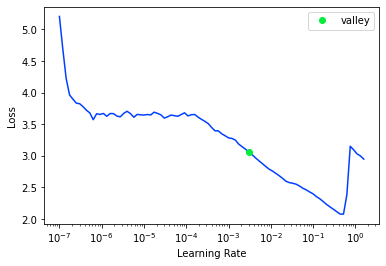

<Figure size 720x720 with 0 Axes>

XGBoost Predictions vs Actual==========
   actual  predicted
0    0.38       0.36
1    0.23       0.38
2    0.43       0.42
3    0.33       0.32
4    0.25       0.33
XGBoost RMSE:  0.0971509


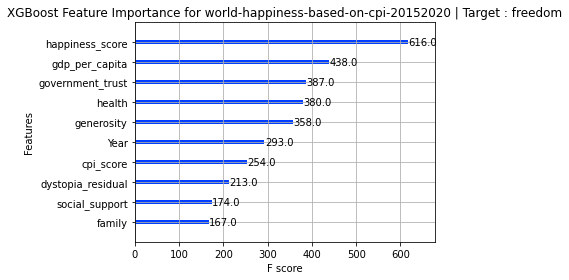

Target Variable: health
CATS=====================
['Year']
CONTS=====================
['happiness_score', 'gdp_per_capita', 'family', 'freedom', 'generosity', 'government_trust', 'dystopia_residual', 'social_support', 'cpi_score']
10
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['happiness_score', 'gdp_per_capita', 'family', 'freedom', 'generosity', 'government_trust', 'dystopia_residual', 'social_support', 'cpi_score']
Categorical variables that made the cut : ['Year']
Tabular Object size: 792


  2%|▏         | 1/42 [00:00<00:05,  7.69it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.7298458146903504, 'Adjusted R-Squared': 0.711467978955, 'RMSE': 0.12504442430318347, 'Time taken': 0.12987661361694336}


 14%|█▍        | 6/42 [00:00<00:01, 28.70it/s]

{'Model': 'BaggingRegressor', 'R-Squared': 0.7869427931010916, 'Adjusted R-Squared': 0.7724491055569481, 'RMSE': 0.11104694008321124, 'Time taken': 0.057875633239746094}
{'Model': 'BayesianRidge', 'R-Squared': 0.7282227356325842, 'Adjusted R-Squared': 0.7097344863558892, 'RMSE': 0.12541949355933987, 'Time taken': 0.012409687042236328}
{'Model': 'DecisionTreeRegressor', 'R-Squared': 0.6861859972864689, 'Adjusted R-Squared': 0.6648381059454123, 'RMSE': 0.13477043822308504, 'Time taken': 0.01530599594116211}
{'Model': 'DummyRegressor', 'R-Squared': -0.0013050261826108578, 'Adjusted R-Squared': -0.06942101435829873, 'RMSE': 0.24073635, 'Time taken': 0.009879350662231445}
{'Model': 'ElasticNet', 'R-Squared': -0.0013050261826108578, 'Adjusted R-Squared': -0.06942101435829873, 'RMSE': 0.24073635, 'Time taken': 0.010573387145996094}
ElasticNetCV model failed to execute
Gram matrix passed in via 'precompute' parameter did not pass validation when a single element was checked - please check that

 24%|██▍       | 10/42 [00:00<00:01, 18.48it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': 0.8142560544977203, 'Adjusted R-Squared': 0.8016204119465449, 'RMSE': 0.10368497196171439, 'Time taken': 0.25080323219299316}
GammaRegressor model failed to execute
Some value(s) of y are out of the valid range for family GammaDistribution
{'Model': 'GaussianProcessRegressor', 'R-Squared': 0.48548828028214774, 'Adjusted R-Squared': 0.4504874830224299, 'RMSE': 0.17256635154767258, 'Time taken': 0.07841730117797852}
{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.8115394792523651, 'Adjusted R-Squared': 0.7987190356640906, 'RMSE': 0.10444043565965393, 'Time taken': 0.26761698722839355}


 40%|████      | 17/42 [00:01<00:02, 12.48it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.8263747872906838, 'Adjusted R-Squared': 0.8145635483308664, 'RMSE': 0.10024549778730268, 'Time taken': 0.3411853313446045}
{'Model': 'HuberRegressor', 'R-Squared': 0.7279758585617743, 'Adjusted R-Squared': 0.7094708149265208, 'RMSE': 0.12547644491777657, 'Time taken': 0.025794506072998047}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.7387995456751789, 'Adjusted R-Squared': 0.7210308072857352, 'RMSE': 0.122954786, 'Time taken': 0.014177560806274414}
{'Model': 'KernelRidge', 'R-Squared': -6.8074563376183175, 'Adjusted R-Squared': -7.338575816367863, 'RMSE': 0.67222285, 'Time taken': 0.03938794136047363}
{'Model': 'Lars', 'R-Squared': 0.727791055056568, 'Adjusted R-Squared': 0.7092734397542937, 'RMSE': 0.12551907, 'Time taken': 0.02570033073425293}
{'Model': 'LarsCV', 'R-Squared': 0.7285335944160921, 'Adjusted R-Squared': 0.710066491995418, 'RMSE': 0.12534775, 'Time taken': 0.05249619483947754}
{'Model': 'Lasso', 'R-Squared': -0

 48%|████▊     | 20/42 [00:01<00:01, 14.87it/s]

LassoCV model failed to execute
Gram matrix passed in via 'precompute' parameter did not pass validation when a single element was checked - please check that it was computed properly. For element (5,6) we computed 144.61227416992188 but the user-supplied value was 144.6123046875.
{'Model': 'LassoLars', 'R-Squared': -0.0013050261826108578, 'Adjusted R-Squared': -0.06942101435829873, 'RMSE': 0.24073635, 'Time taken': 0.012960433959960938}
{'Model': 'LassoLarsCV', 'R-Squared': 0.7285335944160921, 'Adjusted R-Squared': 0.710066491995418, 'RMSE': 0.12534775, 'Time taken': 0.02556157112121582}
{'Model': 'LassoLarsIC', 'R-Squared': 0.727791055056568, 'Adjusted R-Squared': 0.7092734397542937, 'RMSE': 0.12551907, 'Time taken': 0.013836145401000977}
{'Model': 'LinearRegression', 'R-Squared': 0.7277910049941609, 'Adjusted R-Squared': 0.7092733862862808, 'RMSE': 0.12551907, 'Time taken': 0.010822296142578125}
{'Model': 'LinearSVR', 'R-Squared': 0.7225782485813346, 'Adjusted R-Squared': 0.70370602

 69%|██████▉   | 29/42 [00:02<00:00, 14.59it/s]

{'Model': 'MLPRegressor', 'R-Squared': 0.7147228085688031, 'Adjusted R-Squared': 0.6953161969068169, 'RMSE': 0.1284967, 'Time taken': 0.3797614574432373}
{'Model': 'NuSVR', 'R-Squared': 0.8774073895039374, 'Adjusted R-Squared': 0.8690677561368583, 'RMSE': 0.08423462133087979, 'Time taken': 0.13199186325073242}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.6665629095684723, 'Adjusted R-Squared': 0.6438801143010214, 'RMSE': 0.1389202112900007, 'Time taken': 0.011827945709228516}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.732724462568068, 'Adjusted R-Squared': 0.714542453218957, 'RMSE': 0.12437643002178449, 'Time taken': 0.019175052642822266}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': 0.6236134110303388, 'Adjusted R-Squared': 0.5980088811684572, 'RMSE': 0.14759632757201568, 'Time taken': 0.01326441764831543}
{'Model': 'PoissonRegressor', 'R-Squared': 0.5837562409433972, 'Adjusted R-Squared': 0.5554403389667575, 'RMSE': 0.15521452095046867, 'Time taken': 0.01

 76%|███████▌  | 32/42 [00:11<00:08,  1.13it/s]

{'Model': 'QuantileRegressor', 'R-Squared': -0.0334237072620831, 'Adjusted R-Squared': -0.10372463972889157, 'RMSE': 0.24456690719665855, 'Time taken': 9.573941469192505}
{'Model': 'RANSACRegressor', 'R-Squared': 0.6950841738742429, 'Adjusted R-Squared': 0.6743416006684091, 'RMSE': 0.132846, 'Time taken': 0.15351557731628418}


 81%|████████  | 34/42 [00:12<00:06,  1.30it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.7985564927086775, 'Adjusted R-Squared': 0.7848528527568868, 'RMSE': 0.10797796006819306, 'Time taken': 0.4277079105377197}
{'Model': 'Ridge', 'R-Squared': 0.7278788436779446, 'Adjusted R-Squared': 0.70936720039073, 'RMSE': 0.12549882, 'Time taken': 0.01320028305053711}
{'Model': 'RidgeCV', 'R-Squared': 0.7283111351012079, 'Adjusted R-Squared': 0.7098288993938071, 'RMSE': 0.12539909465233215, 'Time taken': 0.011971473693847656}
{'Model': 'SGDRegressor', 'R-Squared': 0.7284689634425441, 'Adjusted R-Squared': 0.7099974643570028, 'RMSE': 0.12536266620639705, 'Time taken': 0.011962175369262695}
{'Model': 'SVR', 'R-Squared': 0.8501243217696528, 'Adjusted R-Squared': 0.8399286974002415, 'RMSE': 0.09313738969521874, 'Time taken': 0.0289919376373291}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.7277910049941609, 'Adjusted R-Squared': 0.7092733862862808, 'RMSE': 0.12551907, 'Time taken': 0.011394023895263672}
{'Model': 'TweedieRegressor

100%|██████████| 42/42 [00:12<00:00,  3.25it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.8251617127593927, 'Adjusted R-Squared': 0.8132679517226167, 'RMSE': 0.10059508, 'Time taken': 0.47695302963256836}
{'Model': 'LGBMRegressor', 'R-Squared': 0.8422666670693899, 'Adjusted R-Squared': 0.8315365083666273, 'RMSE': 0.09554769650744317, 'Time taken': 0.09015703201293945}
Project: world-happiness-based-on-cpi-20152020
world-happiness-based-on-cpi-20152020
Target: health
health
Target Standard Deviation: 0.22992317378520966
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
NuSVR                                        0.87       0.88  0.08        0.13
SVR                                          0.84       0.85  0.09        0.03
LGBMRegressor                                0.83       0.84  0.10        0.09
HistGradientBoostingRegressor                0.81       0.83  0.10        0.34
XGBRegressor                                 0.81 

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time
0,7.015949,12.085415,3.476408,00:00
1,4.896817,4.158580,2.039260,00:00
2,3.492504,5.145016,2.268263,00:00


Better model found at epoch 0 with _rmse value: 3.4764082431793213.
Better model found at epoch 1 with _rmse value: 2.039259672164917.
No improvement since epoch 1: early stopping


,Year,happiness_score,gdp_per_capita,family,freedom,generosity,government_trust,dystopia_residual,social_support,cpi_score,health,health_pred
0,4.00,0.28,0.56,-0.93,-0.18,-1.21,-0.95,-1.27,1.36,-0.86,0.60,1.25
1,3.00,0.56,0.84,-0.93,0.93,-0.56,-0.65,-1.27,1.43,0.85,0.95,5.05
2,3.00,-0.28,0.24,-0.93,0.64,-1.27,-0.25,-1.27,0.81,-0.18,0.89,0.70
3,3.00,-0.53,-1.29,-0.93,0.09,0.59,-0.35,-1.27,0.97,-0.70,0.68,2.37
4,3.00,0.13,0.64,-0.93,-0.62,-1.07,-0.89,-1.27,1.32,-0.81,0.73,0.48
5,6.00,-0.74,0.24,-0.93,-0.85,0.52,0.14,-0.08,0.44,-1.02,0.75,0.57
6,6.00,1.57,1.57,-0.93,1.25,-0.14,2.23,0.72,1.22,1.84,0.99,-0.67
7,1.00,-0.45,-0.89,1.62,0.20,1.76,-0.81,0.15,-0.94,-0.86,0.55,3.95
8,2.00,1.17,1.53,0.93,0.79,0.80,3.39,0.47,-0.94,2.05,1.03,-0.11


<Figure size 432x288 with 0 Axes>

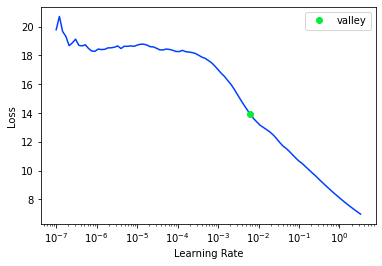

<Figure size 720x720 with 0 Axes>

XGBoost Predictions vs Actual==========
   actual  predicted
0    0.81       0.75
1    0.98       0.99
2    1.04       1.02
3    0.81       0.72
4    0.86       0.88
XGBoost RMSE:  0.10046991


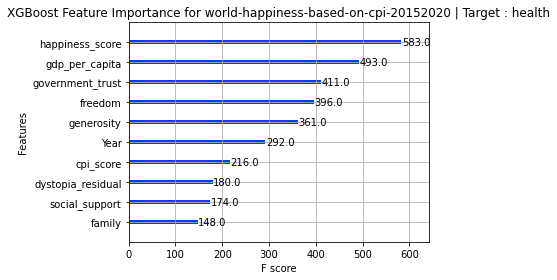

Target Variable: family
CATS=====================
['Year']
CONTS=====================
['happiness_score', 'gdp_per_capita', 'health', 'freedom', 'generosity', 'government_trust', 'dystopia_residual', 'social_support', 'cpi_score']
10
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['happiness_score', 'gdp_per_capita', 'health', 'freedom', 'generosity', 'government_trust', 'dystopia_residual', 'social_support', 'cpi_score']
Categorical variables that made the cut : ['Year']
Tabular Object size: 792


  2%|▏         | 1/42 [00:00<00:05,  7.42it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.9465091200140058, 'Adjusted R-Squared': 0.9428702846408089, 'RMSE': 0.1264787705679029, 'Time taken': 0.13460230827331543}


 17%|█▋        | 7/42 [00:00<00:01, 33.38it/s]

{'Model': 'BaggingRegressor', 'R-Squared': 0.9515083636714154, 'Adjusted R-Squared': 0.9482096129007634, 'RMSE': 0.12042348291710575, 'Time taken': 0.045793771743774414}
{'Model': 'BayesianRidge', 'R-Squared': 0.930506810323949, 'Adjusted R-Squared': 0.9257793824548299, 'RMSE': 0.14416136541287317, 'Time taken': 0.01336050033569336}
{'Model': 'DecisionTreeRegressor', 'R-Squared': 0.8919876672423903, 'Adjusted R-Squared': 0.8846398895037774, 'RMSE': 0.1797274601122718, 'Time taken': 0.013858795166015625}
{'Model': 'DummyRegressor', 'R-Squared': -0.006037359163813649, 'Adjusted R-Squared': -0.07447527475318871, 'RMSE': 0.5485103, 'Time taken': 0.010524988174438477}
{'Model': 'ElasticNet', 'R-Squared': -0.006037359163813649, 'Adjusted R-Squared': -0.07447527475318871, 'RMSE': 0.5485103, 'Time taken': 0.011471986770629883}
ElasticNetCV model failed to execute
Gram matrix passed in via 'precompute' parameter did not pass validation when a single element was checked - please check that it wa

 26%|██▌       | 11/42 [00:00<00:01, 19.92it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': 0.9584191604973966, 'Adjusted R-Squared': 0.9555905319598046, 'RMSE': 0.11151271527272161, 'Time taken': 0.18454718589782715}
GammaRegressor model failed to execute
Some value(s) of y are out of the valid range for family GammaDistribution
{'Model': 'GaussianProcessRegressor', 'R-Squared': 0.862699979977853, 'Adjusted R-Squared': 0.8533598425613804, 'RMSE': 0.20263434848652578, 'Time taken': 0.08794713020324707}
{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.9572596024233053, 'Adjusted R-Squared': 0.9543520923840744, 'RMSE': 0.11305689217722015, 'Time taken': 0.25330281257629395}


 43%|████▎     | 18/42 [00:01<00:01, 13.45it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.9699316290377717, 'Adjusted R-Squared': 0.9678861616253752, 'RMSE': 0.09482715343787398, 'Time taken': 0.312455415725708}
{'Model': 'HuberRegressor', 'R-Squared': 0.9293967054986171, 'Adjusted R-Squared': 0.9245937602944414, 'RMSE': 0.14530824163062325, 'Time taken': 0.024824142456054688}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.9405598317803593, 'Adjusted R-Squared': 0.9365162829218803, 'RMSE': 0.1333269, 'Time taken': 0.014522075653076172}
{'Model': 'KernelRidge', 'R-Squared': 0.06625335948851241, 'Adjusted R-Squared': 0.002733179861880486, 'RMSE': 0.5284359, 'Time taken': 0.04453253746032715}
{'Model': 'Lars', 'R-Squared': 0.9306890120546047, 'Adjusted R-Squared': 0.9259739788610404, 'RMSE': 0.14397225, 'Time taken': 0.026970624923706055}
{'Model': 'LarsCV', 'R-Squared': 0.9306890120546047, 'Adjusted R-Squared': 0.9259739788610404, 'RMSE': 0.14397225, 'Time taken': 0.05318284034729004}
{'Model': 'Lasso', 'R-Squared': -

 57%|█████▋    | 24/42 [00:01<00:00, 20.37it/s]

LassoCV model failed to execute
Gram matrix passed in via 'precompute' parameter did not pass validation when a single element was checked - please check that it was computed properly. For element (5,6) we computed 139.04806518554688 but the user-supplied value was 139.04803466796875.
{'Model': 'LassoLars', 'R-Squared': -0.006037359163813649, 'Adjusted R-Squared': -0.07447527475318871, 'RMSE': 0.5485103, 'Time taken': 0.012327194213867188}
{'Model': 'LassoLarsCV', 'R-Squared': 0.9306890120546047, 'Adjusted R-Squared': 0.9259739788610404, 'RMSE': 0.14397225, 'Time taken': 0.026754379272460938}
{'Model': 'LassoLarsIC', 'R-Squared': 0.9300096832901702, 'Adjusted R-Squared': 0.9252484372554879, 'RMSE': 0.14467607, 'Time taken': 0.014013290405273438}
{'Model': 'LinearRegression', 'R-Squared': 0.9306888446379251, 'Adjusted R-Squared': 0.925973800055471, 'RMSE': 0.14397243, 'Time taken': 0.011837482452392578}
{'Model': 'LinearSVR', 'R-Squared': 0.9276759750965496, 'Adjusted R-Squared': 0.9227

 67%|██████▋   | 28/42 [00:02<00:01,  8.64it/s]

{'Model': 'MLPRegressor', 'R-Squared': 0.9533360593202372, 'Adjusted R-Squared': 0.9501616415869201, 'RMSE': 0.11813225, 'Time taken': 0.8839166164398193}
{'Model': 'NuSVR', 'R-Squared': 0.9710681486423464, 'Adjusted R-Squared': 0.9690999954887645, 'RMSE': 0.09301775996074373, 'Time taken': 0.15473079681396484}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.7661458802725004, 'Adjusted R-Squared': 0.7502374367536229, 'RMSE': 0.2644540830221351, 'Time taken': 0.011609077453613281}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.9260940901087307, 'Adjusted R-Squared': 0.9210664771909572, 'RMSE': 0.14866794837742284, 'Time taken': 0.019061803817749023}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': 0.7677257513575647, 'Adjusted R-Squared': 0.751924782062161, 'RMSE': 0.2635592700463589, 'Time taken': 0.012202739715576172}
{'Model': 'PoissonRegressor', 'R-Squared': 0.6329176536934908, 'Adjusted R-Squared': 0.6079460655093745, 'RMSE': 0.33132904871068136, 'Time taken': 0.

 79%|███████▊  | 33/42 [00:19<00:11,  1.27s/it]

{'Model': 'QuantileRegressor', 'R-Squared': -0.9714973129952666, 'Adjusted R-Squared': -1.1056127764643326, 'RMSE': 0.7678490633782187, 'Time taken': 17.30206036567688}
{'Model': 'RANSACRegressor', 'R-Squared': 0.6563805054798234, 'Adjusted R-Squared': 0.6330050296621244, 'RMSE': 0.3205654, 'Time taken': 0.14400649070739746}


 83%|████████▎ | 35/42 [00:20<00:07,  1.03s/it]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.9533781288920722, 'Adjusted R-Squared': 0.95020657303439, 'RMSE': 0.1180789856709763, 'Time taken': 0.29376769065856934}
{'Model': 'Ridge', 'R-Squared': 0.9305466736843516, 'Adjusted R-Squared': 0.9258219576084572, 'RMSE': 0.14412001, 'Time taken': 0.012918233871459961}
{'Model': 'RidgeCV', 'R-Squared': 0.9305466202499736, 'Adjusted R-Squared': 0.9258219005390874, 'RMSE': 0.14412006729808916, 'Time taken': 0.013688325881958008}
{'Model': 'SGDRegressor', 'R-Squared': 0.9267173621291536, 'Adjusted R-Squared': 0.9217321486685518, 'RMSE': 0.14803973907835344, 'Time taken': 0.0118408203125}
{'Model': 'SVR', 'R-Squared': 0.9591108930728516, 'Adjusted R-Squared': 0.9563293211730456, 'RMSE': 0.11058127082638074, 'Time taken': 0.030031919479370117}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.9306888446379251, 'Adjusted R-Squared': 0.925973800055471, 'RMSE': 0.14397243, 'Time taken': 0.012136220932006836}
{'Model': 'TweedieRegressor', 

100%|██████████| 42/42 [00:20<00:00,  2.01it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.9541004048821665, 'Adjusted R-Squared': 0.9509779834455792, 'RMSE': 0.11716077, 'Time taken': 0.4722263813018799}
{'Model': 'LGBMRegressor', 'R-Squared': 0.9712131633434294, 'Adjusted R-Squared': 0.9692548751354995, 'RMSE': 0.09278435132762775, 'Time taken': 0.09247517585754395}
Project: world-happiness-based-on-cpi-20152020
world-happiness-based-on-cpi-20152020
Target: family
family
Target Standard Deviation: 0.553429365158081
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
LGBMRegressor                                0.97       0.97  0.09        0.09
NuSVR                                        0.97       0.97  0.09        0.15
HistGradientBoostingRegressor                0.97       0.97  0.09        0.31
SVR                                          0.96       0.96  0.11        0.03
ExtraTreesRegressor                          0.96    

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time
0,2.302819,16.215342,4.026827,00:00
1,2.079640,15.265752,3.907141,00:00
2,1.669189,2.421829,1.556223,00:00
3,1.253884,0.513811,0.716806,00:00
4,0.959795,0.424059,0.651198,00:00
5,0.749751,0.268250,0.517928,00:00
6,0.600668,0.258527,0.508455,00:00
7,0.488792,0.236950,0.486775,00:00
8,0.401339,0.214510,0.463152,00:00
9,0.337864,0.200889,0.448207,00:00


Better model found at epoch 0 with _rmse value: 4.026827335357666.
Better model found at epoch 1 with _rmse value: 3.9071412086486816.
Better model found at epoch 2 with _rmse value: 1.5562225580215454.
Better model found at epoch 3 with _rmse value: 0.7168063521385193.
Better model found at epoch 4 with _rmse value: 0.6511982679367065.
Better model found at epoch 5 with _rmse value: 0.5179281830787659.
Better model found at epoch 6 with _rmse value: 0.5084554553031921.
Better model found at epoch 7 with _rmse value: 0.48677539825439453.
Better model found at epoch 8 with _rmse value: 0.4631522595882416.
Better model found at epoch 9 with _rmse value: 0.4482067823410034.
No improvement since epoch 9: early stopping


,Year,happiness_score,gdp_per_capita,health,freedom,generosity,government_trust,dystopia_residual,social_support,cpi_score,family,family_pred
0,5.00,1.63,1.36,0.79,1.04,1.42,2.63,1.08,-0.97,2.15,1.09,0.54
1,6.00,0.78,-0.48,0.45,0.65,-0.76,-0.07,1.44,0.83,-0.40,0.00,0.23
2,6.00,0.76,-0.24,0.10,0.88,0.94,-1.08,1.25,0.89,-0.40,0.00,0.21
3,3.00,0.37,-0.26,0.79,0.42,-0.86,-0.90,-1.25,1.35,0.02,0.00,0.09
4,6.00,1.52,0.89,1.41,0.66,1.34,1.83,0.80,1.32,1.73,0.00,0.66
5,3.00,0.87,0.59,1.17,-0.47,-0.20,-0.64,-1.25,1.18,1.21,0.00,0.10
6,6.00,1.25,0.95,1.36,0.49,-0.53,0.78,0.90,1.22,1.68,0.00,0.12
7,1.00,0.44,0.91,-0.44,-0.35,-1.31,-0.85,0.77,-0.97,-0.76,1.47,0.68
8,2.00,-0.31,0.29,0.52,-0.51,-0.61,-1.10,0.52,-0.97,0.22,0.89,0.32


<Figure size 432x288 with 0 Axes>

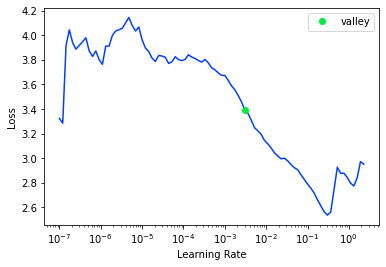

<Figure size 720x720 with 0 Axes>

XGBoost Predictions vs Actual==========
   actual  predicted
0    0.00      -0.00
1    0.89       0.86
2    0.00      -0.01
3    0.00      -0.00
4    1.49       1.38
XGBoost RMSE:  0.1171709


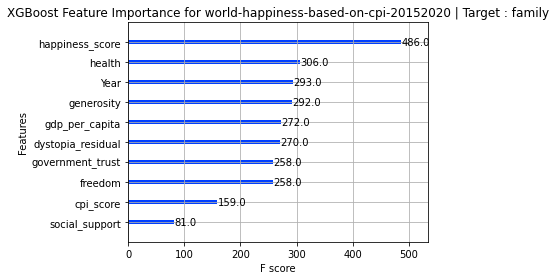

Target Variable: gdp_per_capita
CATS=====================
['Year']
CONTS=====================
['happiness_score', 'family', 'health', 'freedom', 'generosity', 'government_trust', 'dystopia_residual', 'social_support', 'cpi_score']
10
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['happiness_score', 'family', 'health', 'freedom', 'generosity', 'government_trust', 'dystopia_residual', 'social_support', 'cpi_score']
Categorical variables that made the cut : ['Year']
Tabular Object size: 792


  2%|▏         | 1/42 [00:00<00:05,  7.37it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.8412241419802137, 'Adjusted R-Squared': 0.8304230632033575, 'RMSE': 0.15888690051974017, 'Time taken': 0.13550400733947754}


 12%|█▏        | 5/42 [00:00<00:01, 23.78it/s]

{'Model': 'BaggingRegressor', 'R-Squared': 0.8609350295617313, 'Adjusted R-Squared': 0.8514748274911008, 'RMSE': 0.14869786496611345, 'Time taken': 0.0615544319152832}
{'Model': 'BayesianRidge', 'R-Squared': 0.8033728354592671, 'Adjusted R-Squared': 0.7899968378714621, 'RMSE': 0.1768143941361046, 'Time taken': 0.013034820556640625}
{'Model': 'DecisionTreeRegressor', 'R-Squared': 0.7942670528390775, 'Adjusted R-Squared': 0.7802716142567018, 'RMSE': 0.18086218893694148, 'Time taken': 0.01605844497680664}
{'Model': 'DummyRegressor', 'R-Squared': -9.808326808036227e-05, 'Adjusted R-Squared': -0.0681319664835962, 'RMSE': 0.39876512, 'Time taken': 0.010582923889160156}
{'Model': 'ElasticNet', 'R-Squared': -9.808326808036227e-05, 'Adjusted R-Squared': -0.0681319664835962, 'RMSE': 0.39876512, 'Time taken': 0.012438535690307617}
ElasticNetCV model failed to execute
Gram matrix passed in via 'precompute' parameter did not pass validation when a single element was checked - please check that it w

 21%|██▏       | 9/42 [00:00<00:02, 15.91it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': 0.8906994158117315, 'Adjusted R-Squared': 0.8832640019213731, 'RMSE': 0.1318278291750366, 'Time taken': 0.2612602710723877}
GammaRegressor model failed to execute
Some value(s) of y are out of the valid range for family GammaDistribution
{'Model': 'GaussianProcessRegressor', 'R-Squared': 0.5393074801627509, 'Adjusted R-Squared': 0.5079678529629379, 'RMSE': 0.2706458918878758, 'Time taken': 0.07284760475158691}


 29%|██▊       | 12/42 [00:00<00:02, 12.56it/s]

{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.8683660852343631, 'Adjusted R-Squared': 0.8594113971550681, 'RMSE': 0.14467042511161687, 'Time taken': 0.24138426780700684}


 40%|████      | 17/42 [00:01<00:02, 11.94it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.8917131116035402, 'Adjusted R-Squared': 0.8843466566105838, 'RMSE': 0.13121509410328652, 'Time taken': 0.3403470516204834}
{'Model': 'HuberRegressor', 'R-Squared': 0.8022269865447855, 'Adjusted R-Squared': 0.7887730400512335, 'RMSE': 0.17732884052831788, 'Time taken': 0.025713443756103516}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.8055334461259194, 'Adjusted R-Squared': 0.7923044288555737, 'RMSE': 0.17584026, 'Time taken': 0.013799428939819336}
{'Model': 'KernelRidge', 'R-Squared': -4.236956565142906, 'Adjusted R-Squared': -4.593212113792084, 'RMSE': 0.9125052, 'Time taken': 0.051897287368774414}
{'Model': 'Lars', 'R-Squared': 0.8032856951702073, 'Adjusted R-Squared': 0.7899037696715819, 'RMSE': 0.17685358, 'Time taken': 0.05792737007141113}


 48%|████▊     | 20/42 [00:01<00:01, 14.53it/s]

{'Model': 'LarsCV', 'R-Squared': 0.8032856951702073, 'Adjusted R-Squared': 0.7899037696715819, 'RMSE': 0.17685358, 'Time taken': 0.06951260566711426}
{'Model': 'Lasso', 'R-Squared': -9.808326808036227e-05, 'Adjusted R-Squared': -0.0681319664835962, 'RMSE': 0.39876512, 'Time taken': 0.011783361434936523}
LassoCV model failed to execute
Gram matrix passed in via 'precompute' parameter did not pass validation when a single element was checked - please check that it was computed properly. For element (5,6) we computed 142.14794921875 but the user-supplied value was 142.14797973632812.
{'Model': 'LassoLars', 'R-Squared': -9.808326808036227e-05, 'Adjusted R-Squared': -0.0681319664835962, 'RMSE': 0.39876512, 'Time taken': 0.01273965835571289}
{'Model': 'LassoLarsCV', 'R-Squared': 0.8032856951702073, 'Adjusted R-Squared': 0.7899037696715819, 'RMSE': 0.17685358, 'Time taken': 0.026700973510742188}
{'Model': 'LassoLarsIC', 'R-Squared': 0.8032856951702073, 'Adjusted R-Squared': 0.7899037696715819

 67%|██████▋   | 28/42 [00:02<00:01,  9.40it/s]

{'Model': 'MLPRegressor', 'R-Squared': 0.8593271002270272, 'Adjusted R-Squared': 0.8497575152084575, 'RMSE': 0.14955504, 'Time taken': 0.8589351177215576}
{'Model': 'NuSVR', 'R-Squared': 0.9225014814878756, 'Adjusted R-Squared': 0.9172294734258263, 'RMSE': 0.1110050046123569, 'Time taken': 0.1349647045135498}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.6327312888835197, 'Adjusted R-Squared': 0.6077470228211741, 'RMSE': 0.24165057029703, 'Time taken': 0.01918315887451172}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.7510525627456555, 'Adjusted R-Squared': 0.7341173629324347, 'RMSE': 0.19895263199207006, 'Time taken': 0.023975372314453125}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': 0.6511796983830744, 'Adjusted R-Squared': 0.627450426164236, 'RMSE': 0.23550315821613385, 'Time taken': 0.015709400177001953}
{'Model': 'PoissonRegressor', 'R-Squared': 0.6480211234710771, 'Adjusted R-Squared': 0.6240769822106061, 'RMSE': 0.23656699830903627, 'Time taken': 0.0173

 79%|███████▊  | 33/42 [00:12<00:07,  1.23it/s]

{'Model': 'QuantileRegressor', 'R-Squared': -0.030837278536596457, 'Adjusted R-Squared': -0.10096226347105897, 'RMSE': 0.4048469919976383, 'Time taken': 9.349604606628418}
{'Model': 'RANSACRegressor', 'R-Squared': 0.7348183806328121, 'Adjusted R-Squared': 0.716778814689466, 'RMSE': 0.20533717, 'Time taken': 0.13618683815002441}


 81%|████████  | 34/42 [00:12<00:06,  1.32it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.8692907040672265, 'Adjusted R-Squared': 0.8603989152282623, 'RMSE': 0.14416143498754458, 'Time taken': 0.4133930206298828}
{'Model': 'Ridge', 'R-Squared': 0.803343981234323, 'Adjusted R-Squared': 0.7899660207740729, 'RMSE': 0.17682737, 'Time taken': 0.013067483901977539}
{'Model': 'RidgeCV', 'R-Squared': 0.803343668012268, 'Adjusted R-Squared': 0.789965686244395, 'RMSE': 0.17682750787153806, 'Time taken': 0.011947393417358398}
{'Model': 'SGDRegressor', 'R-Squared': 0.7970307585764583, 'Adjusted R-Squared': 0.7832233271871017, 'RMSE': 0.17964327887532816, 'Time taken': 0.011446714401245117}
{'Model': 'SVR', 'R-Squared': 0.904685943627552, 'Adjusted R-Squared': 0.8982019942144602, 'RMSE': 0.12310461529168668, 'Time taken': 0.0334625244140625}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.8032856558865127, 'Adjusted R-Squared': 0.7899037277155272, 'RMSE': 0.17685358, 'Time taken': 0.011893749237060547}
{'Model': 'TweedieRegressor'

100%|██████████| 42/42 [00:13<00:00,  3.17it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.859786286681434, 'Adjusted R-Squared': 0.8502479388366335, 'RMSE': 0.14931077, 'Time taken': 0.4774203300476074}
{'Model': 'LGBMRegressor', 'R-Squared': 0.8841378178206745, 'Adjusted R-Squared': 0.87625603672004, 'RMSE': 0.13572714407248307, 'Time taken': 0.09529519081115723}
Project: world-happiness-based-on-cpi-20152020
world-happiness-based-on-cpi-20152020
Target: gdp_per_capita
gdp_per_capita
Target Standard Deviation: 0.3821618854999542
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
NuSVR                                        0.92       0.92  0.11        0.13
SVR                                          0.90       0.90  0.12        0.03
HistGradientBoostingRegressor                0.88       0.89  0.13        0.34
ExtraTreesRegressor                          0.88       0.89  0.13        0.26
LGBMRegressor                          

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time
0,8.083350,50.605515,7.113755,00:00
1,5.511502,25.281750,5.028096,00:00
2,4.136104,11.025628,3.320486,00:00
3,3.073273,5.362696,2.315750,00:00
4,2.346698,1.573925,1.254562,00:00
5,1.823362,0.449385,0.670362,00:00
6,1.441665,0.217868,0.466763,00:00
7,1.157540,0.175301,0.418690,00:00
8,0.938196,0.164963,0.406156,00:00
9,0.769298,0.118651,0.344458,00:00


Better model found at epoch 0 with _rmse value: 7.113755226135254.
Better model found at epoch 1 with _rmse value: 5.0280961990356445.
Better model found at epoch 2 with _rmse value: 3.320486068725586.
Better model found at epoch 3 with _rmse value: 2.3157496452331543.
Better model found at epoch 4 with _rmse value: 1.2545619010925293.
Better model found at epoch 5 with _rmse value: 0.6703616380691528.
Better model found at epoch 6 with _rmse value: 0.466763436794281.
Better model found at epoch 7 with _rmse value: 0.41868969798088074.
Better model found at epoch 8 with _rmse value: 0.40615636110305786.
Better model found at epoch 9 with _rmse value: 0.34445762634277344.
No improvement since epoch 9: early stopping


,Year,happiness_score,family,health,freedom,generosity,government_trust,dystopia_residual,social_support,cpi_score,gdp_per_capita,gdp_per_capita_pred
0,3.00,-0.89,-0.90,0.33,0.67,-0.39,0.16,-1.27,0.48,-0.83,0.56,0.32
1,1.00,-0.68,0.40,-0.03,-1.21,1.42,-0.70,0.12,-0.97,-0.88,1.16,0.46
2,3.00,-0.22,-0.90,0.59,-0.06,-1.46,-0.45,-1.27,0.26,-0.21,0.80,0.75
3,1.00,0.57,1.85,0.29,-0.89,-0.63,-0.93,0.68,-0.97,0.36,1.33,0.39
4,4.00,1.35,-0.90,0.99,1.26,0.77,1.67,-1.27,1.51,1.49,1.45,1.08
5,4.00,1.65,-0.90,1.15,1.57,0.58,2.38,-1.27,1.38,2.11,1.36,0.99
6,5.00,0.25,0.58,-0.07,-0.36,-0.56,-0.67,1.27,-0.97,-0.42,1.00,0.67
7,2.00,1.32,1.45,1.08,1.06,0.07,0.92,0.98,-0.97,1.70,1.31,1.14
8,1.00,-0.45,1.82,-0.38,-0.23,1.02,-0.85,-0.24,-0.97,-0.26,1.03,0.53


<Figure size 432x288 with 0 Axes>

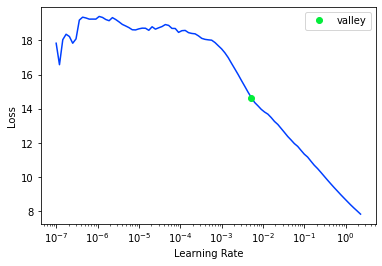

<Figure size 720x720 with 0 Axes>

XGBoost Predictions vs Actual==========
   actual  predicted
0    1.27       1.47
1    1.31       1.28
2    1.48       1.49
3    1.07       0.99
4    0.71       0.78
XGBoost RMSE:  0.14915992


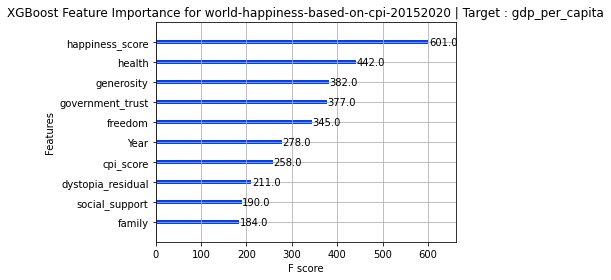

<Figure size 432x288 with 0 Axes>

In [20]:

if SEP_DOLLAR:
    #For every column in df, if the column contains a $, make a new column with the value without the $
    for col in df.columns:
        if '$' in df[col].to_string():
            df[col + '_no_dollar'] = df[col].str.replace('$', '').str.replace(',', '')


if SEP_PERCENT:
    #For every column in df, if the column contains a %, make a new column with the value without the %
    for col in df.columns:
        if '%' in df[col].to_string():
            df[col + '_no_percent'] = df[col].str.replace('%', '').str.replace(',', '')

target = ''
target_str = ''
#The column closest to the end isPARAM_DIR the target variable that can be represented as a float is the target variable
targets = []
#Loop through every possible target column (Continuous)
for i in range(len(df.columns)-1, 0, -1):
    try:
        df[df.columns[i]] = df[df.columns[i]].astype(float)
        target = df.columns[i]
        target_str = target.replace('/', '-')
    except:
        continue
    print(f'Target Variable: {target}')
    #Will be determined by the file name


    #===================================================================================================

    #Create project config files if they don't exist.
    if not os.path.exists(param_dir):
        #create param_dir
        os.makedirs(PARAM_DIR)
    if not os.path.exists(f'{PARAM_DIR}/cats.txt'):
        #create param_dir
        with open(f'{PARAM_DIR}/cats.txt', 'w') as f:
            f.write('')
    if not os.path.exists(f'{PARAM_DIR}/conts.txt'):
        #create param_dir
        with open(f'{PARAM_DIR}/conts.txt', 'w') as f:
            f.write('')
    if not os.path.exists(f'{PARAM_DIR}/cols_to_delete.txt'):
        with open(f'{PARAM_DIR}/cols_to_delete.txt', 'w') as f:
            f.write('')

    df = df.drop_duplicates()
    if SHUFFLE_DATA:
        df = df.sample(frac=1).reset_index(drop=True)

    # workaround for fastai/pytorch bug where bool is treated as object and thus erroring out.
    for n in df:
        if pd.api.types.is_bool_dtype(df[n]):
            df[n] = df[n].astype('uint8')

    with open(f'{PARAM_DIR}/cols_to_delete.txt', 'r') as f:
        cols_to_delete = f.read().splitlines()
    for col in cols_to_delete:
        try:
            del(df[col])
        except:
            pass
    #try to fill in missing values now, otherwise FastAI will do it for us later
    try:
        df = df.fillna(0)
    except:
        pass
    #print missing values
    #print(df.isna().sum().sort_values(ascending=False))
    #shrink df as much as possible
    df = df_shrink(df)


    #print types inside of df
    #print(df.dtypes)


    #Auto detect categorical and continuous variables
    #==============================================================================
    likely_cat = {}
    for var in df.columns:
        likely_cat[var] = 1.*df[var].nunique()/df[var].count() < 0.05 #or some other threshold

    cats = [var for var in df.columns if likely_cat[var]]
    conts = [var for var in df.columns if not likely_cat[var]]

    #remove target from lists
    try:
        conts.remove(target)
        cats.remove(target)
    except:
        pass
    #Convert target to float
    df[target] = df[target].astype(float)

    print('CATS=====================')
    print(cats)
    print('CONTS=====================')
    print(conts)

    #Populate categorical and continuous lists
    #==============================================================================

    if VARIABLE_FILES == True:
        with open(f'{PARAM_DIR}/cats.txt', 'r') as f:
            cats = f.read().splitlines()

        with open(f'{PARAM_DIR}/conts.txt', 'r') as f:
            conts = f.read().splitlines()

    #==============================================================================

    #==============================================================================
    procs = [Categorify, FillMissing, Normalize]
    #print(df.describe().T)
    df = df[0:SAMPLE_COUNT]
    splits = RandomSplitter()(range_of(df))

    print((len(cats)) + len(conts))
    #conts = []

    #Convert cont variables to floats
    #==============================================================================

    #Convert cont variables to floats
    #==============================================================================

    for var in conts:
        try:
            df[var] = df[var].astype(float)
        except:
            print(f'Could not convert {var} to float.')
            pass

    #==============================================================================

    #Experimental logic to add columns one-by-one to find a breakpoint
    #==============================================================================
    if ENABLE_BREAKPOINT == True:
        temp_procs = [Categorify, FillMissing]
        print('Looping through continuous variables to find breakpoint')
        cont_list = []
        for cont in conts:
            focus_cont = cont
            cont_list.append(cont)
            #print(focus_cont)
            try:
                to = TabularPandas(df, procs=procs, cat_names=cats, cont_names=cont_list, y_names=target, y_block=RegressionBlock(), splits=splits)
                del(to)
            except:
                print('Error with ', focus_cont)
                #remove focus_cont from list
                cont_list.remove(focus_cont)
                #traceback.print_exc()
                continue
        #convert all continuous variables to floats
        for var in cont_list:
            try:
                df[var] = df[var].astype(float)
            except:
                print(f'Could not convert {var} to float.')
                cont_list.remove(var)
                if CONVERT_TO_CAT == True:
                    cats.append(var)
                pass
        print(f'Continuous variables that made the cut : {cont_list}')
        print(f'Categorical variables that made the cut : {cats}')
        #shrink df as much as possible
        df = df_shrink(df)
        #print(df.dtypes)

    #==============================================================================

    #Creating tabular object + quick preprocessing
    #==============================================================================
    to = None
    if REGRESSOR == True:
        try:
            to = TabularPandas(df, procs, cats, conts, target, y_block=RegressionBlock(), splits=splits)
        except:
            conts = []
            to = TabularPandas(df, procs, cats, conts, target, y_block=RegressionBlock(), splits=splits)
    else:
        try:
            to = TabularPandas(df, procs, cats, conts, target, splits=splits)
        except:
            conts = []
            to = TabularPandas(df, procs, cats, conts, target, splits=splits)

    #print(dir(to))
    #print(to.xs)
    dls = to.dataloaders()
    print(f'Tabular Object size: {len(to)}')
    try:
        dls.one_batch()
    except:
        print(f'problem with getting one batch of {PROJECT_NAME}')
    #==============================================================================

    #Extracting train and test sets from tabular object
    #==============================================================================

    X_train, y_train = to.train.xs, to.train.ys.values.ravel()
    X_test, y_test = to.valid.xs, to.valid.ys.values.ravel()

    #Make sure target isn't in independent columns
    if target in X_train and target in X_test:
        del(X_train[target])
        del(X_test[target])
    #create dataframe from X_train and y_train
    #export tabular object to csv
    pd.DataFrame(X_train).to_csv(f'{PARAM_DIR}/X_train_{target_str}.csv', index=False)
    pd.DataFrame(X_test).to_csv(f'{PARAM_DIR}/X_test_{target_str}.csv', index=False)
    pd.DataFrame(y_train).to_csv(f'{PARAM_DIR}/y_train_{target_str}.csv', index=False)
    pd.DataFrame(y_test).to_csv(f'{PARAM_DIR}/y_test_{target_str}.csv', index=False)

    #==============================================================================

    #==============================================================================

    #Ready for model selection!

    if REGRESSOR == True:
        try:
            reg = LazyRegressor(verbose=2, ignore_warnings=False, custom_metric=None)
            models, predictions = reg.fit(X_train, X_test, y_train, y_test)
            print(f'Project: {PROJECT_NAME}')
            print(PROJECT_NAME)
            print(f'Target: {target}')
            print(target)
            target_std = y_train.std()
            print(f'Target Standard Deviation: {target_std}')
            print(models)
            models['project'] = PROJECT_NAME
            models['target'] = target
            models['target_std'] = target_std
            #rename index of 
            models.to_csv(f'{PARAM_DIR}/regression_results_{target_str}.csv', mode='a', header=True, index=True)
        except:
            print('Issue during lazypredict analysis')
    else:
        #TODO: remove this
        try:
            clf = LazyClassifier(verbose=2, ignore_warnings=False, custom_metric=None)
            models, predictions = clf.fit(X_train, X_test, y_train, y_test)
            print(f'Project: {PROJECT_NAME}')
            print(PROJECT_NAME)
            print(f'Target: {target}')
            print(target)
            print(f'Target Standard Deviation: {y_train.std()}')
            print(models)
            models.to_csv(f'{PARAM_DIR}/classification_results.csv', mode='a', header=False)
        except:
            print('Issue during lazypredict analysis')

    model_name = 'tabnet'

    # FastAI + pre-trained TabNet
    #==============================================================================
    learn = None
    i = 0
    while True:
        try:
            del learn
        except:
            pass
        try:
            learn = 0
            model = TabNetModel(get_emb_sz(to), len(to.cont_names), dls.c, n_d=64, n_a=64, n_steps=5, virtual_batch_size=256)
            # save the best model so far, determined by early stopping
            cbs = [SaveModelCallback(monitor='_rmse', comp=np.less, fname=f'{model_name}_{PROJECT_NAME}_{target_str}_best'), EarlyStoppingCallback()]
            learn = Learner(dls, model, loss_func=MSELossFlat(), metrics=rmse, cbs=cbs)
            #learn = get_learner(to)
            if(learn != 0):
                break
            if i > 50:
                break
        except:
            i += 1
            print('Error in FastAI TabNet')
            traceback.print_exc()
            continue
    try:
        #display learning rate finder results
        x = learn.lr_find()
    except:
        pass
    if AUTO_ADJUST_LEARNING_RATE == True:
        FASTAI_LEARNING_RATE = x.valley
    print(f'LEARNING RATE: {FASTAI_LEARNING_RATE}')
    try:
        if i < 50:
            learn.fit_one_cycle(20, FASTAI_LEARNING_RATE)
            plt.figure(figsize=(10, 10))
            try:
                ax = learn.show_results()
                plt.show(block=True)
            except:
                print('Could not show results')
                pass
    except:
        print('Could not fit model')
        traceback.print_exc()
        pass

    #==============================================================================

    #fit an xgboost model
    #==============================================================================
    if REGRESSOR == True:
        xgb = XGBRegressor()
    else:
        xgb = XGBClassifier()
    try:
        xgb = XGBRegressor()
        xgb.fit(X_train, y_train)
        y_pred = xgb.predict(X_test)
        print('XGBoost Predictions vs Actual==========')
        print(pd.DataFrame({'actual': y_test, 'predicted': y_pred}).head())
        print('XGBoost RMSE: ', np.sqrt(mean_squared_error(y_test, y_pred)))
        #save feature importance plot to file
        plot_importance(xgb)
        plt.title(f'XGBoost Feature Importance for {PROJECT_NAME} | Target : {target}', wrap=True)
        plt.tight_layout()
        plt.show()
        plt.savefig(f'{PARAM_DIR}/xgb_feature_importance_{target_str}.png')
        fi_df = pd.DataFrame([xgb.get_booster().get_score()]).T
        fi_df.columns = ['importance']
        #create a column based off the index called feature
        fi_df['feature'] = fi_df.index
        #create a dataframe of feature importance
        fi_df = fi_df[['feature', 'importance']]
        fi_df.to_csv(f'{PARAM_DIR}/xgb_feature_importance_{target_str}.csv', index=False)
        #xgb_fi = pd.DataFrame(xgb.feature_importances_, index=X_train.columns, columns=['importance'])
        #xgb_fi.to_csv(f'{PARAM_DIR}/xgb_feature_importance_{target_str}.csv')
        #print('XGBoost AUC: ', roc_auc_score(y_test, y_pred))
    except:
        traceback.print_exc()
        print('XGBoost failed')

# <div style="text-align: center; background-color: blue; color: white; padding: 14px; line-height: 1;border-radius:20px">**Overall Feature Importance**</div>

           feature  importance
0             Year      292.00
1  happiness_score      583.00
2   gdp_per_capita      493.00
3           family      148.00
4          freedom      396.00


<AxesSubplot:title={'center':'XGBoost Overall Feature Importance'}, xlabel='feature'>

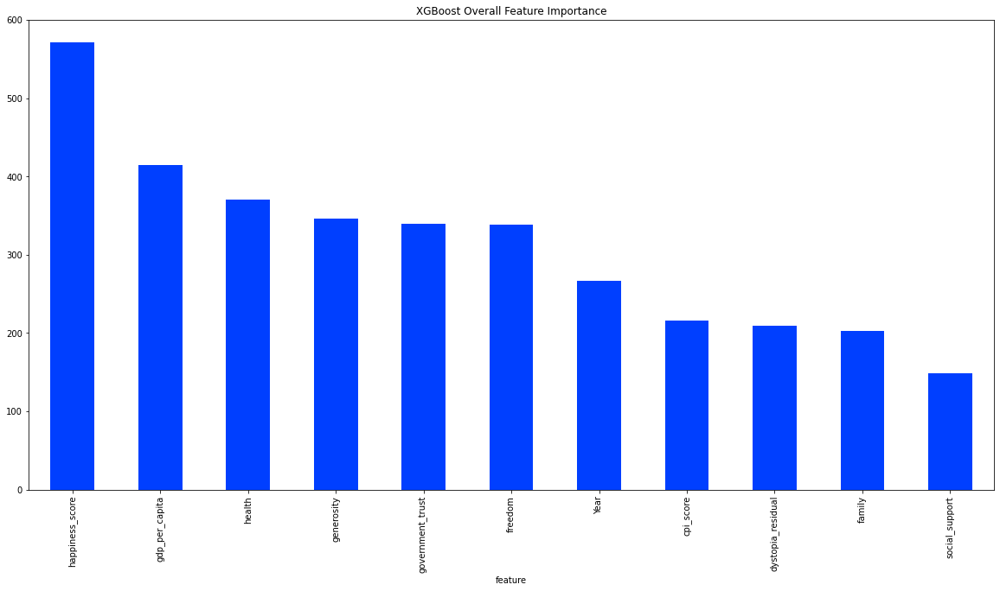

In [21]:
out_dir = f'./{PROJECT_NAME}'
xgb_feature_importance_csvs = []

for file in os.listdir(out_dir):
    if 'xgb_feature_importance' in file and '.csv' in file:
        xgb_feature_importance_csvs.append(pd.read_csv(os.path.join(out_dir, file)))

xgb_feature_importance = pd.concat(xgb_feature_importance_csvs,axis=0)
xgb_feature_importance.rename(columns={'Unnamed: 0': 'feature'}, inplace=True)
print(xgb_feature_importance.head())
xgb_feature_importance.groupby('feature')['importance'].mean().sort_values(ascending=False).plot(kind='bar', title='XGBoost Overall Feature Importance', figsize=(20, 10))

In [22]:
df.isna().sum()

happiness_score      0
gdp_per_capita       0
family               0
health               0
freedom              0
generosity           0
government_trust     0
dystopia_residual    0
Year                 0
social_support       0
cpi_score            0
dtype: int64

# **To Be Continued...**